In [1]:
# initial setup
try:
    # settings colab:
    import google.colab
        
except ModuleNotFoundError:    
    # settings local:
    %run "common/0_notebooks_base_setup.py"

default checking
Running command `conda list`... ok
jupyterlab=1.2.6 already installed
pandas=1.0.3 already installed
matplotlib=2.2.2 already installed
bokeh=2.0.0 already installed
seaborn=0.10.0 already installed
ipywidgets=7.5.1 already installed
pytest=5.3.4 already installed
chardet=3.0.4 already installed
psutil=5.7.0 already installed
scipy=1.4.1 already installed
statsmodels=0.11.0 already installed
scikit-learn=0.22.1 already installed
xlrd=1.2.0 already installed
plotly=4.6.0 already installed
chart-studio=1.1.0 already installed
plotly-orca=1.3.1 already installed
Running command `conda install --yes unicodedata2`... ok
Solving environment: ...working... done

# All requested packages already installed.


Importando librerías ...
Las librerías has sido importadas con éxito


In [2]:
# LECTURA DEL ARCHIVO DE DATOS
data_clean = pd.read_csv("CleanCSV/Clean07_Final.csv")

In [3]:
# SÓLO PARA USO EN COMPARACIONES
data_clean_ORIGINAL = data_clean.copy(deep=True) 

In [4]:
data_clean.head(3)

,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
0,0,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
1,1,Argentina,Buenos Aires,Zona Sur,La Plata,La Plata,La Plata,sell,apartment,3432039.0,...,False,False,False,False,True,False,True,False,False,NaN
2,2,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN


In [5]:
data_clean.columns

Index(['Unnamed: 0', 'País', 'Provincia', 'Área', 'Localidad', 'Zona', 'Lugar', 'operation', 'property_type', 'geonames_id', 'lat', 'lon', 'price_aprox_usd', 'surface_total_in_m2', 'surface_covered_in_m2', 'price_usd_per_m2', 'floor', 'rooms', 'expenses', 'garage|cochera_dummy', 'lavadero_dummy', 'balcon_dummy', 'parrilla_dummy', 'piscina_dummy', 'terraza_dummy', 'patio_dummy', 'jardin_dummy', 'quincho_dummy', 'aire acondicionado_dummy', 'amenities_dummy', 'estrenar_dummy', 'gimnasio_dummy', 'frente_dummy', 'subte_dummy', 'baulera_dummy', 'Outliers'], dtype='object')

<hr id="Ubicaciones">

#### AGRUPANDO y DETECTANDO OUTLIERS (por RANGO INTERCUARTIL) en "price_usd_per_m2" y "price_aprox_usd"

In [6]:
# PRUEBA PARA ENTENDER CÓMO DEVUELVE LOS FRAME LA ITERACIÓN SOBRE EL GROUPBY 
# LOS VOY A AGRUPAR POR LOCALIDAD y POR TIPO DE PROPIEDAD PARA ELEIMINAR OUTLIERS

grupos_x_localidad = data_clean.loc[(data_clean["Área"] == "Capital Federal")].groupby(["Localidad", "property_type"])
for localidad, frame in grupos_x_localidad:
    display(frame)

,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5354,5354,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,False,False,False,False,False,False,True,False,False,NaN
5357,5357,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,False,False,False,False,False,False,True,False,False,NaN
7685,7685,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,False,False,False,False,False,False,False,False,False,NaN
8874,8874,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,False,False,False,False,False,False,True,False,False,NaN
26888,26888,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,False,False,False,False,False,False,False,False,False,NaN
27161,27161,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,False,False,False,False,False,False,True,True,False,NaN
30229,30229,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,False,False,False,False,False,False,False,False,False,NaN
30238,30238,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,False,False,False,False,False,False,False,False,False,NaN
31430,31430,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,False,False,False,False,False,False,True,False,False,NaN
34610,34610,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
791,791,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN
5356,5356,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,False,False,False,False,False,False,True,False,False,NaN
5395,5395,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN
5493,5493,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,False,False,True,False,False,False,True,False,False,NaN
12842,12842,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN
17996,17996,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,False,False,True,False,False,False,False,True,True,NaN
19603,19603,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,False,False,False,True,True,False,False,False,False,NaN
19604,19604,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,False,False,False,True,True,False,False,False,False,NaN
20373,20373,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,False,False,True,False,False,False,True,True,False,NaN
20634,20634,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,False,False,True,True,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
9055,9055,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,False,False,False,False,False,False,True,False,False,NaN
56062,56062,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,False,False,False,False,False,False,False,False,False,NaN
56063,56063,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,False,False,False,False,False,False,False,False,False,NaN
56064,56064,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,False,False,False,False,False,False,False,False,False,NaN
56065,56065,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,False,False,False,False,False,False,False,False,False,NaN
56066,56066,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,False,False,False,False,False,False,False,False,False,NaN
56067,56067,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,False,False,False,False,False,False,False,False,False,NaN
56068,56068,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,False,False,False,False,False,False,False,False,False,NaN
56069,56069,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,False,False,False,False,False,False,False,False,False,NaN
67149,67149,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,False,True,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
31188,31188,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,NaN
45919,45919,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,NaN
52060,52060,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,False,False,False,False,False,False,True,False,False,NaN
57895,57895,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,False,False,False,False,False,False,True,False,False,NaN
58101,58101,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,False,False,False,False,False,False,True,True,False,price_aprox_usd
61009,61009,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,False,False,False,False,False,False,True,False,False,NaN
81090,81090,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,NaN
84589,84589,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,NaN
100644,100644,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,False,False,False,False,True,False,False,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
8218,8218,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,PH,3436487.0,...,False,False,False,False,False,False,True,False,False,NaN
8467,8467,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,PH,3436487.0,...,False,False,False,False,False,False,False,False,True,NaN
45268,45268,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,PH,3436487.0,...,False,False,False,False,False,False,True,False,False,NaN
47096,47096,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,PH,3436487.0,...,False,False,False,False,False,False,True,False,True,NaN
53702,53702,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,PH,3436487.0,...,False,False,False,False,False,False,False,False,False,NaN
62777,62777,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,PH,3436487.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
119376,119376,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,PH,3436487.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
382,382,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,False,False,False,False,True,False,True,False,True,NaN
5826,5826,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,False,True,True,False,False,False,True,False,True,NaN
5994,5994,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,False,False,False,False,False,False,False,False,True,NaN
12393,12393,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,False,False,False,False,False,False,True,False,False,NaN
29712,29712,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,False,False,False,False,False,False,True,False,True,NaN
30976,30976,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,False,False,True,False,False,False,True,False,False,NaN
33218,33218,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,False,False,False,False,False,False,True,False,False,NaN
40073,40073,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,False,False,False,False,False,False,True,False,False,NaN
41141,41141,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,False,False,False,False,False,False,True,False,False,NaN
41312,41312,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,False,False,True,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
2037,2037,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,house,3436487.0,...,False,False,False,False,False,False,True,False,False,NaN
49702,49702,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,house,3436487.0,...,False,False,False,False,False,False,False,False,False,NaN
62783,62783,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,house,3436487.0,...,False,True,False,False,False,False,True,False,False,NaN
98674,98674,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,house,3436487.0,...,False,False,False,False,False,False,True,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
82667,82667,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,store,3436487.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
231,231,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,False,False,False,False,False,False,False,True,False,NaN
728,728,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,False,False,True,False,False,False,False,False,True,NaN
729,729,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,False,False,True,False,False,False,False,False,True,NaN
730,730,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,False,False,True,False,False,False,False,False,True,NaN
1014,1014,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,False,False,False,False,False,False,False,True,True,NaN
4317,4317,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,False,False,False,False,False,False,False,False,False,NaN
5353,5353,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,False,False,False,False,False,False,True,False,False,NaN
5358,5358,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,False,False,False,False,False,False,True,False,False,NaN
5398,5398,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,False,False,False,False,False,False,True,True,False,NaN
7166,7166,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,False,False,False,False,False,False,False,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
98,98,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,False,False,False,True,True,False,True,True,False,NaN
388,388,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,False,False,False,False,False,False,True,True,True,NaN
405,405,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,False,False,False,False,False,False,True,False,False,NaN
656,656,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,False,False,True,True,True,False,True,False,False,NaN
742,742,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,False,False,True,False,False,False,False,False,True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120802,120802,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,False,False,False,True,False,False,False,True,False,NaN
120881,120881,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,False,False,False,True,False,False,False,True,False,NaN
120882,120882,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,False,False,False,True,False,False,False,True,False,NaN
120883,120883,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,False,False,False,True,False,False,False,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1747,1747,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,False,False,False,False,False,False,False,False,False,NaN
2532,2532,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,False,False,False,False,False,False,True,True,False,NaN
3339,3339,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,False,False,False,False,False,False,False,True,False,NaN
3922,3922,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,False,False,False,False,False,False,False,False,False,NaN
4223,4223,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,False,False,False,False,False,False,False,True,False,NaN
5397,5397,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,False,False,False,False,False,False,False,False,False,NaN
6431,6431,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,False,True,False,True,False,False,True,False,False,NaN
6751,6751,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,False,False,False,False,False,False,False,False,False,NaN
7129,7129,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,False,False,False,False,False,False,True,True,False,NaN
9557,9557,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,False,False,False,False,False,False,False,False,False,surface_total


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
10070,10070,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,False,False,False,False,False,False,False,False,False,NaN
10795,10795,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
12738,12738,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,False,False,False,False,False,False,False,True,False,NaN
12739,12739,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,False,False,False,False,False,False,False,True,False,NaN
18583,18583,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,False,False,False,False,False,False,False,False,False,NaN
23419,23419,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,False,False,False,False,False,False,False,True,False,price_usd_m2
30598,30598,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,False,False,False,False,False,False,False,False,False,NaN
31414,31414,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,False,False,False,False,False,False,False,False,False,NaN
32073,32073,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,False,False,False,False,False,False,True,False,False,NaN
37884,37884,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,False,True,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
734,734,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,False,False,True,False,False,False,False,False,True,NaN
735,735,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,False,False,True,False,False,False,False,False,True,NaN
736,736,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,False,False,True,False,False,False,False,False,True,NaN
4770,4770,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,False,False,True,False,False,False,True,False,False,NaN
9044,9044,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,False,False,False,False,False,False,True,True,False,NaN
9101,9101,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,False,False,False,False,False,False,True,True,False,NaN
11458,11458,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,False,True,False,False,False,False,True,False,False,NaN
16036,16036,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,False,False,False,False,False,False,False,True,False,NaN
20272,20272,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,False,False,False,False,False,False,False,False,False,NaN
20637,20637,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,False,False,False,False,False,False,False,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
48,48,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,False,False,False,False,False,False,True,False,True,NaN
157,157,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,False,False,False,False,False,False,True,False,False,NaN
167,167,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,False,False,True,False,False,False,True,True,False,NaN
720,720,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,False,False,False,False,False,False,False,False,False,NaN
737,737,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,False,False,True,False,False,False,False,False,True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119968,119968,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,False,False,False,False,False,False,False,False,False,NaN
119969,119969,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,False,False,False,False,False,False,False,False,False,NaN
119970,119970,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,False,False,False,False,False,False,False,False,False,NaN
120736,120736,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
3716,3716,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,False,True,False,False,False,False,True,False,False,NaN
13635,13635,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,True,True,False,False,False,False,False,False,False,NaN
16237,16237,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,False,False,False,False,False,False,True,True,False,NaN
33339,33339,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,False,False,False,False,True,False,False,False,False,NaN
37798,37798,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,False,False,True,False,False,False,False,True,False,NaN
44169,44169,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,False,False,False,False,False,False,False,False,False,NaN
44862,44862,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,False,False,False,False,False,False,False,False,False,NaN
45163,45163,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,False,False,False,False,False,False,False,True,False,NaN
80982,80982,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,False,False,False,False,False,False,False,True,False,NaN
114356,114356,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,False,False,False,False,False,False,True,True,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
10347,10347,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,False,False,False,False,False,False,True,False,False,NaN
12297,12297,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,False,False,False,False,False,False,False,False,False,NaN
12714,12714,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,False,False,False,False,False,False,False,False,False,NaN
19726,19726,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
28067,28067,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,False,False,False,False,False,False,True,False,False,NaN
30685,30685,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,False,False,False,False,False,False,False,False,False,NaN
31378,31378,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,False,False,False,False,False,False,True,True,False,NaN
32973,32973,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
33639,33639,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,False,False,False,False,False,False,False,True,False,NaN
36174,36174,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
79016,79016,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,Fondo de Comercio,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
121073,121073,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,Fondo de Comercio,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
187,187,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,False,True,False,False,False,False,False,False,False,NaN
4866,4866,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,False,True,False,False,False,False,False,False,False,NaN
4873,4873,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,False,True,False,False,False,False,True,False,True,NaN
4882,4882,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,False,True,False,False,False,False,True,False,True,NaN
4901,4901,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
4902,4902,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
4906,4906,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
10495,10495,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
10496,10496,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,False,True,False,False,False,False,False,False,False,NaN
10499,10499,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,False,True,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
341,341,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,False,False,False,False,False,False,True,False,False,NaN
640,640,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,False,False,True,False,False,False,False,False,True,NaN
1094,1094,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,False,False,False,True,False,False,False,False,False,NaN
1097,1097,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,False,False,False,True,False,False,False,False,False,NaN
1119,1119,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,False,False,False,True,False,False,False,False,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118193,118193,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,False,False,False,True,False,False,True,False,False,NaN
118194,118194,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,False,False,False,True,False,False,True,False,False,NaN
118195,118195,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,False,False,False,True,False,False,True,False,False,NaN
118196,118196,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,False,False,False,True,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1722,1722,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,False,False,False,False,False,False,True,False,False,NaN
1723,1723,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
4843,4843,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
4845,4845,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,False,True,False,False,False,False,False,False,False,NaN
4862,4862,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
4863,4863,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
4883,4883,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,False,False,False,False,False,False,True,False,False,NaN
4885,4885,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
4916,4916,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,False,False,False,False,False,False,True,False,False,NaN
7171,7171,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
4839,4839,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,False,False,False,False,True,False,False,False,False,NaN
4858,4858,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,False,False,False,False,False,True,True,False,False,price_usd_m2
10105,10105,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
11071,11071,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
32394,32394,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
60958,60958,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
80378,80378,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
84897,84897,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
85349,85349,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN
95225,95225,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
31268,31268,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,Fondo de Comercio,3436109.0,...,False,False,True,False,False,False,False,False,False,NaN
31269,31269,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,Fondo de Comercio,3436109.0,...,False,False,True,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
23185,23185,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,False,False,False,False,False,False,True,False,False,NaN
32104,32104,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,False,False,False,False,False,False,False,False,False,NaN
32853,32853,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,False,False,False,False,False,False,False,False,False,NaN
42722,42722,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,False,False,False,False,False,False,False,False,False,NaN
49994,49994,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,False,False,False,False,False,False,False,False,False,NaN
53353,53353,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,False,False,False,False,True,False,False,False,True,NaN
63634,63634,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,False,False,False,False,False,False,False,False,False,NaN
70220,70220,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,False,False,True,False,False,False,True,False,False,NaN
72625,72625,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,False,False,False,False,False,False,False,False,False,NaN
84796,84796,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,False,False,False,False,False,False,True,True,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
178,178,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,False,False,False,False,False,False,True,False,False,NaN
262,262,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,False,False,False,False,False,False,False,False,False,NaN
491,491,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,False,False,False,False,True,False,False,True,False,NaN
697,697,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,False,False,False,False,False,False,True,False,False,NaN
712,712,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,False,False,False,False,False,False,True,False,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120074,120074,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,False,False,False,False,False,False,True,False,False,NaN
120303,120303,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,False,False,False,False,False,False,True,False,True,NaN
120809,120809,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,False,False,False,False,False,False,True,True,False,NaN
121121,121121,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
14074,14074,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,house,3436109.0,...,False,False,False,False,False,False,False,False,True,NaN
29169,29169,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,house,3436109.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
32717,32717,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,house,3436109.0,...,True,False,True,False,False,False,True,False,False,price_usd_m2
32786,32786,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,house,3436109.0,...,True,False,True,False,False,False,True,False,False,price_usd_m2
72269,72269,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,house,3436109.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
72340,72340,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,house,3436109.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
114224,114224,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,house,3436109.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
638,638,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,False,False,False,False,False,False,True,False,False,NaN
1024,1024,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,False,False,False,False,False,False,False,False,False,NaN
1163,1163,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,False,False,False,False,False,False,True,False,False,NaN
7382,7382,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
10834,10834,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
11476,11476,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
18015,18015,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
22891,22891,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,False,False,False,False,False,False,False,False,False,NaN
23422,23422,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,False,False,True,False,False,False,True,False,False,NaN
24358,24358,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
99066,99066,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,Fondo de Comercio,3436077.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
691,691,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,False,False,False,False,False,False,False,False,False,NaN
692,692,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,False,False,False,False,False,False,False,False,False,NaN
693,693,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,False,False,False,False,False,False,False,False,False,NaN
7668,7668,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,False,True,False,False,False,False,True,False,False,NaN
10101,10101,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,False,False,False,False,False,False,False,False,False,NaN
10305,10305,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,False,False,False,False,False,False,False,False,True,price_usd_m2
13989,13989,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,True,False,False,False,False,False,False,False,False,NaN
22425,22425,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,False,False,False,False,False,False,True,False,False,NaN
32079,32079,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,False,False,False,False,False,False,False,False,False,NaN
32135,32135,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
7,7,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,False,False,False,False,True,False,False,False,False,NaN
8,8,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,False,False,False,False,True,False,False,False,False,NaN
120,120,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,False,False,False,False,False,False,False,True,False,NaN
210,210,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,False,False,False,False,False,False,True,True,False,NaN
216,216,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,False,False,True,False,False,False,False,False,True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121128,121128,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,False,False,False,False,False,False,True,False,True,NaN
121157,121157,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,False,False,False,True,False,True,True,False,False,NaN
121160,121160,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,False,False,True,False,False,False,True,False,True,NaN
121209,121209,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,False,False,True,False,False,False,True,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1776,1776,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,False,False,False,False,False,False,False,False,False,NaN
3886,3886,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,False,False,False,False,False,False,False,True,False,NaN
4294,4294,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,False,False,False,False,False,False,False,False,False,NaN
6506,6506,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
6807,6807,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,False,True,False,False,False,False,False,False,True,price_aprox_usd
6809,6809,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,False,True,False,False,False,False,True,False,False,price_aprox_usd
8328,8328,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
8420,8420,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
9900,9900,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,False,False,False,False,False,False,False,False,False,NaN
11958,11958,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
57,57,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,False,False,False,False,False,False,True,True,False,price_usd_m2
1770,1770,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,False,False,False,False,False,False,True,False,False,NaN
2822,2822,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,False,False,False,False,False,False,False,False,False,NaN
5212,5212,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,False,False,False,False,False,False,False,False,False,NaN
10197,10197,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
11070,11070,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,False,False,False,False,False,False,False,False,False,NaN
13227,13227,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,False,False,True,False,False,False,False,False,False,NaN
13242,13242,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,False,False,False,False,False,False,False,False,False,NaN
16372,16372,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,False,False,False,False,False,False,False,True,False,NaN
21863,21863,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5864,5864,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,False,False,False,False,False,False,True,False,False,NaN
7908,7908,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
10510,10510,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,False,False,False,False,False,False,False,False,False,NaN
10513,10513,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,False,False,False,False,False,False,True,False,False,NaN
17079,17079,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,False,True,False,False,False,False,False,False,True,price_usd_m2
17998,17998,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,False,False,False,False,False,False,True,False,False,NaN
33404,33404,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,False,False,False,False,False,False,True,False,False,NaN
39589,39589,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,False,False,False,False,False,False,True,False,False,NaN
39590,39590,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,False,False,False,False,False,False,False,False,False,NaN
42065,42065,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
496,496,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,False,False,False,False,False,False,False,False,False,NaN
564,564,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,False,False,False,False,False,False,True,False,False,NaN
639,639,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,False,False,True,False,False,False,False,False,True,NaN
1697,1697,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,False,False,False,False,False,False,False,False,False,NaN
1923,1923,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,False,False,False,False,False,False,False,False,False,NaN
2612,2612,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,False,False,False,False,False,False,False,False,False,NaN
4211,4211,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,False,False,False,False,False,False,True,False,False,NaN
4849,4849,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,False,False,False,False,False,False,True,False,False,NaN
5330,5330,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,False,False,True,False,False,False,False,False,False,NaN
6044,6044,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
4888,4888,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,False,False,False,False,False,False,True,False,False,NaN
10501,10501,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,False,False,False,False,False,False,True,False,False,NaN
15584,15584,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,False,True,False,False,False,False,True,False,False,NaN
23833,23833,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,False,False,False,False,False,False,True,False,False,NaN
32894,32894,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,False,False,False,False,False,False,False,False,False,NaN
36114,36114,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,False,False,False,False,False,False,True,False,False,NaN
40617,40617,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,False,False,False,False,False,False,False,False,False,NaN
43768,43768,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,False,True,False,False,False,False,False,False,False,NaN
44175,44175,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,False,False,False,False,False,False,False,False,False,NaN
44507,44507,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5331,5331,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,store,3436004.0,...,False,False,False,False,False,False,False,False,False,NaN
16888,16888,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,store,3436004.0,...,False,False,False,False,False,False,False,False,False,NaN
23021,23021,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,store,3436004.0,...,False,False,False,False,False,False,False,False,False,NaN
66045,66045,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,store,3436004.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
83224,83224,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,store,3436004.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
119598,119598,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,store,3436004.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
14234,14234,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,Fondo de Comercio,3436003.0,...,False,False,False,False,False,False,True,False,False,NaN
26955,26955,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,Fondo de Comercio,3436003.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
731,731,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,False,False,True,False,False,False,False,False,True,NaN
732,732,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,False,False,True,False,False,False,False,False,True,NaN
733,733,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,False,False,True,False,False,False,False,False,True,NaN
4887,4887,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,False,False,False,False,False,False,True,False,False,NaN
10498,10498,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,False,False,False,False,False,False,False,False,False,NaN
10796,10796,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,False,False,False,False,False,False,False,False,False,NaN
12723,12723,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,False,False,False,False,False,False,False,True,False,NaN
14238,14238,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,False,False,False,False,False,False,False,False,False,NaN
18854,18854,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,False,False,False,False,False,False,False,False,True,NaN
26940,26940,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,False,False,False,False,False,False,True,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
35,35,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,False,False,True,False,False,False,True,False,False,NaN
66,66,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,False,False,False,False,False,False,True,True,False,NaN
739,739,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,False,False,True,False,False,False,False,False,True,NaN
740,740,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,False,False,True,False,False,False,False,False,True,NaN
741,741,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,False,False,True,False,False,False,False,False,True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119308,119308,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,False,False,True,False,False,False,True,True,False,NaN
119345,119345,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,False,False,False,False,False,False,True,True,False,NaN
119346,119346,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,False,False,False,False,False,False,True,True,False,NaN
120794,120794,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,False,False,False,False,False,True,True,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
51,51,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,True,False,False,False,False,False,False,False,False,NaN
1858,1858,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,False,False,False,False,False,False,False,False,False,NaN
5657,5657,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,False,False,False,False,False,False,False,False,False,NaN
16605,16605,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,False,True,False,False,False,False,True,True,False,NaN
17392,17392,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,True,False,False,False,False,False,True,False,False,price_aprox_usd
18013,18013,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,True,False,False,False,False,False,False,False,False,NaN
18524,18524,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,False,False,False,False,False,False,False,False,False,NaN
19382,19382,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,False,True,False,False,False,False,True,False,False,price_aprox_usd
20199,20199,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,False,False,False,False,False,False,True,False,True,price_usd_m2
23375,23375,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,False,True,False,False,False,False,False,True,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
10278,10278,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,False,False,False,False,False,False,True,False,False,NaN
12320,12320,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,False,False,False,False,False,False,False,False,False,NaN
15485,15485,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,False,False,False,False,False,False,True,False,False,NaN
20638,20638,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,False,False,False,False,False,False,False,False,False,NaN
24404,24404,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,False,False,False,False,False,False,False,False,False,NaN
32241,32241,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,False,False,False,False,False,False,False,True,False,NaN
32280,32280,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,False,False,False,False,False,False,False,True,False,NaN
40280,40280,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,False,False,False,False,False,False,False,False,False,NaN
48137,48137,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,False,False,False,False,False,False,False,True,False,price_usd_m2
51646,51646,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
6329,6329,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN
6495,6495,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN
6496,6496,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN
7703,7703,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,False,False,False,False,False,False,True,False,False,NaN
7708,7708,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,False,False,False,False,False,False,True,False,False,NaN
9068,9068,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,False,False,False,False,True,False,True,False,False,NaN
10340,10340,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,False,False,False,False,False,False,False,True,True,NaN
11256,11256,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
12260,12260,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN
13348,13348,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
52,52,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,False,False,False,False,False,False,True,True,True,NaN
53,53,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,False,False,False,False,False,False,False,True,False,NaN
54,54,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,False,False,False,True,False,False,False,False,True,NaN
55,55,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,False,False,False,True,False,False,False,False,True,NaN
59,59,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,False,False,False,False,False,False,True,False,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120933,120933,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,False,True,False,False,False,False,True,False,True,NaN
120984,120984,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN
121071,121071,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,False,False,False,False,False,False,False,False,True,NaN
121075,121075,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
787,787,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,False,False,False,False,False,False,True,False,False,NaN
790,790,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN
1885,1885,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,False,False,False,False,False,False,False,True,False,NaN
1886,1886,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN
1891,1891,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,False,False,False,False,False,False,False,True,False,NaN
2458,2458,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN
2485,2485,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,False,False,False,False,False,False,True,True,False,NaN
2995,2995,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN
3956,3956,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,False,False,False,False,False,False,True,True,True,NaN
3957,3957,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,False,False,False,False,False,False,True,True,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
2377,2377,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,False,False,True,False,False,False,False,False,False,NaN
9097,9097,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN
9488,9488,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
10563,10563,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,False,False,False,False,False,False,True,False,False,NaN
12358,12358,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN
13436,13436,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
19994,19994,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN
26896,26896,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN
31227,31227,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN
37948,37948,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
61008,61008,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,Fondo de Comercio,3433955.0,...,False,False,False,False,False,False,False,False,False,NaN
68166,68166,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,Fondo de Comercio,3433955.0,...,False,False,False,False,False,False,False,False,False,NaN
73097,73097,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,Fondo de Comercio,3433955.0,...,False,False,False,False,False,False,False,False,False,NaN
85182,85182,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,Fondo de Comercio,3433955.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1498,1498,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,True,False,False,False,False,False,True,False,False,NaN
6267,6267,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,False,True,False,False,False,False,False,False,False,NaN
7000,7000,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,False,False,False,False,False,False,False,False,False,NaN
21366,21366,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,False,True,False,False,False,False,False,False,False,NaN
22910,22910,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,False,False,False,False,False,False,True,False,False,NaN
32195,32195,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,False,False,False,False,False,False,True,False,False,NaN
48547,48547,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,False,False,False,False,False,False,False,False,False,NaN
49161,49161,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,False,False,False,False,False,False,True,False,False,NaN
50565,50565,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,False,False,False,False,False,False,False,False,False,NaN
59817,59817,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
901,901,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,False,False,False,False,False,False,True,False,False,NaN
1065,1065,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,False,False,False,False,False,True,False,False,False,NaN
1076,1076,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,True,False,False,False,False,False,False,False,False,NaN
1081,1081,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,False,False,True,False,False,False,False,False,False,NaN
1514,1514,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,True,False,False,False,False,False,False,False,True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121095,121095,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,False,False,True,False,True,False,False,False,False,NaN
121098,121098,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,False,False,True,False,True,False,False,False,False,NaN
121102,121102,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,False,False,True,False,True,False,False,False,False,NaN
121124,121124,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,False,False,True,False,True,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
108,108,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,False,False,False,False,False,False,False,False,False,NaN
110,110,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,True,True,False,False,False,False,True,False,False,NaN
115,115,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,True,False,False,False,False,False,False,False,False,NaN
119,119,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,False,False,False,False,False,False,False,False,False,NaN
121,121,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,True,False,False,False,False,False,True,False,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112014,112014,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,True,True,False,False,False,False,True,False,False,NaN
118485,118485,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,False,False,False,False,False,False,False,False,False,NaN
120694,120694,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,False,True,False,False,False,False,False,False,False,NaN
120814,120814,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,False,False,False,False,False,False,False,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
842,842,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,False,False,False,False,False,False,False,False,False,NaN
4792,4792,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,False,False,True,False,False,False,False,False,False,NaN
6952,6952,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,False,False,False,False,False,False,False,False,False,NaN
8843,8843,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,False,False,False,False,False,False,False,False,False,NaN
9866,9866,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
10720,10720,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,False,False,False,False,False,False,False,False,False,NaN
11770,11770,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
21365,21365,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,False,False,False,False,False,False,False,False,False,NaN
35020,35020,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,False,False,True,False,False,False,False,False,False,NaN
37060,37060,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
2763,2763,Argentina,Capital Federal,Capital Federal,Catalinas,Catalinas,Catalinas,sell,apartment,NaN,...,False,False,False,False,False,False,True,False,False,NaN
5495,5495,Argentina,Capital Federal,Capital Federal,Catalinas,Catalinas,Catalinas,sell,apartment,NaN,...,False,False,True,False,False,False,True,False,False,NaN
63654,63654,Argentina,Capital Federal,Capital Federal,Catalinas,Catalinas,Catalinas,sell,apartment,NaN,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
73605,73605,Argentina,Capital Federal,Capital Federal,Catalinas,Catalinas,Catalinas,sell,store,NaN,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
6446,6446,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,Fondo de Comercio,3435548.0,...,False,False,False,False,False,False,False,False,False,NaN
6447,6447,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,Fondo de Comercio,3435548.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1539,1539,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,False,False,False,False,False,False,True,False,False,NaN
1649,1649,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,False,False,False,False,False,False,True,False,False,NaN
4529,4529,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,False,False,False,False,False,False,True,False,False,NaN
5319,5319,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,False,False,False,False,False,False,True,True,False,NaN
5629,5629,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,False,False,False,False,False,False,True,True,False,NaN
6416,6416,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,False,False,False,False,False,False,False,False,False,NaN
6578,6578,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,False,False,False,False,False,False,False,False,False,NaN
7143,7143,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,False,False,False,False,False,False,False,True,False,NaN
7263,7263,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,False,False,False,False,False,False,True,True,False,NaN
7812,7812,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
33411,33411,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,house,3435548.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1657,1657,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
4299,4299,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,False,False,False,False,False,False,False,False,False,NaN
6505,6505,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,False,False,False,False,False,False,False,False,False,NaN
8439,8439,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
9487,9487,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,False,False,False,False,False,False,False,False,False,NaN
10484,10484,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
12324,12324,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,False,False,False,False,False,False,False,False,False,NaN
14514,14514,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,False,False,False,False,False,False,False,False,False,NaN
14548,14548,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,False,False,True,False,False,False,False,False,False,surface_total
16382,16382,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
18998,18998,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,False,True,False,False,False,False,False,True,False,NaN
23497,23497,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,False,True,False,False,False,False,False,False,False,NaN
31204,31204,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,False,False,False,False,False,False,True,True,False,NaN
31468,31468,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,False,False,False,False,False,False,False,False,False,NaN
35364,35364,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,False,False,False,False,False,False,True,False,False,NaN
37701,37701,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,False,False,False,False,False,False,False,False,False,NaN
39434,39434,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,False,False,False,False,False,False,False,False,False,NaN
39438,39438,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,False,False,False,False,False,False,False,False,False,NaN
42602,42602,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,False,False,False,False,False,False,False,False,False,NaN
52484,52484,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,False,False,False,False,False,False,False,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
958,958,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,False,False,False,False,False,False,False,True,False,NaN
959,959,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,False,False,False,False,False,False,False,True,False,NaN
960,960,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,False,False,False,False,False,False,False,True,False,NaN
965,965,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,False,False,False,False,False,False,False,True,False,NaN
969,969,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,False,False,False,False,False,False,False,True,False,NaN
970,970,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,False,False,False,False,False,False,False,True,False,NaN
971,971,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,False,False,False,False,False,False,False,True,False,NaN
972,972,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,False,False,False,False,False,False,False,True,False,NaN
973,973,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,False,False,False,False,False,False,False,True,False,NaN
7099,7099,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,False,False,True,True,False,False,True,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
17399,17399,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,False,False,False,False,False,False,True,True,False,NaN
49871,49871,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,False,False,False,False,False,False,False,False,False,NaN
62583,62583,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,False,False,False,False,False,False,True,False,False,NaN
63615,63615,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,False,False,False,False,False,False,False,False,False,NaN
95220,95220,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,False,False,False,False,False,False,True,True,False,NaN
106455,106455,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,False,False,False,False,False,False,False,False,False,NaN
110674,110674,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,False,False,False,False,False,False,False,True,False,NaN
117955,117955,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,False,False,False,False,False,False,False,True,False,NaN
119370,119370,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
215,215,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,store,3435506.0,...,False,False,False,False,False,False,True,True,False,NaN
1709,1709,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,store,3435506.0,...,False,False,False,False,False,False,False,False,False,NaN
22603,22603,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,store,3435506.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
51979,51979,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,store,3435506.0,...,False,False,False,False,False,False,False,False,False,NaN
66425,66425,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,store,3435506.0,...,False,False,True,False,False,False,True,False,False,price_aprox_usd
88799,88799,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,store,3435506.0,...,False,False,False,False,False,False,True,False,False,NaN
119213,119213,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,store,3435506.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
99089,99089,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,Fondo de Comercio,3435359.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
694,694,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,False,False,False,False,False,False,False,False,False,NaN
695,695,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,False,False,False,False,False,False,False,False,False,NaN
13069,13069,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,False,False,False,True,False,False,True,False,False,NaN
13072,13072,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,False,False,False,True,False,False,True,False,False,NaN
13075,13075,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,False,False,False,True,False,False,True,False,False,NaN
13077,13077,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,False,False,False,True,False,False,True,False,False,NaN
20574,20574,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,False,False,False,False,False,False,False,False,True,NaN
24826,24826,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,False,False,False,False,False,False,True,False,False,NaN
32787,32787,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,False,True,False,False,False,False,False,False,False,NaN
40026,40026,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
385,385,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,False,False,False,True,False,False,False,False,False,NaN
565,565,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,False,False,False,True,False,False,True,False,False,NaN
781,781,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,False,False,False,False,True,False,True,False,False,NaN
869,869,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,False,False,True,False,False,False,True,False,True,NaN
1534,1534,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,False,False,True,False,False,False,True,False,True,NaN
1619,1619,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,False,False,False,True,True,False,True,False,False,NaN
1620,1620,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,False,False,False,True,True,False,False,False,False,NaN
2290,2290,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,False,False,False,False,True,False,False,False,True,NaN
3975,3975,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,False,False,False,False,False,False,True,True,False,NaN
5713,5713,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,False,False,False,False,True,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
8513,8513,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,True,True,False,False,False,False,True,False,False,NaN
17778,17778,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,False,True,False,False,False,False,True,False,True,NaN
28199,28199,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,False,False,True,False,False,False,False,False,False,NaN
48671,48671,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,False,False,False,False,False,False,False,False,False,NaN
50554,50554,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,True,False,False,False,False,False,False,False,True,NaN
52462,52462,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,False,False,False,False,False,False,True,False,True,NaN
66476,66476,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,False,False,False,False,False,False,False,False,False,NaN
66632,66632,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,False,True,False,False,False,False,True,False,False,NaN
75051,75051,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,True,True,False,False,False,False,True,False,True,NaN
76108,76108,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
8215,8215,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,store,3435359.0,...,False,False,False,False,False,False,False,False,False,NaN
37887,37887,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,store,3435359.0,...,False,False,False,False,True,False,True,False,False,NaN
74017,74017,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,store,3435359.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
79045,79045,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,store,3435359.0,...,False,False,False,False,False,False,False,False,False,NaN
91010,91010,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,store,3435359.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
137,137,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,False,False,False,False,False,False,True,False,False,NaN
1650,1650,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,False,False,False,False,False,False,False,False,False,NaN
6515,6515,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,False,True,False,False,False,False,True,False,True,NaN
6756,6756,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,False,True,False,False,False,False,True,False,True,NaN
11860,11860,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,False,False,False,False,False,False,True,False,False,NaN
13516,13516,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,False,False,False,False,False,False,False,False,False,NaN
18997,18997,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,False,True,False,False,False,False,False,True,False,NaN
27554,27554,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,True,False,False,False,False,False,False,False,False,NaN
36689,36689,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,False,False,False,False,False,False,False,False,False,NaN
38234,38234,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
258,258,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,False,False,False,False,False,False,False,False,False,NaN
690,690,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,False,False,False,False,False,False,True,False,False,NaN
698,698,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,False,False,False,True,True,False,False,False,False,NaN
4446,4446,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,False,False,True,True,True,False,True,False,False,NaN
4831,4831,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,False,False,False,False,False,False,False,False,True,NaN
5318,5318,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,False,False,True,False,False,False,True,True,False,NaN
5323,5323,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,False,False,False,False,False,False,False,False,False,NaN
5476,5476,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,True,False,False,True,True,True,True,True,False,NaN
6324,6324,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,False,False,False,False,True,False,True,False,False,NaN
7036,7036,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,False,False,False,False,True,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
990,990,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
1783,1783,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,False,False,False,False,False,False,False,False,False,NaN
4428,4428,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,True,False,False,False,False,False,True,False,False,NaN
6442,6442,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,False,False,False,False,False,False,True,True,False,price_aprox_usd
8629,8629,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,False,False,True,False,False,False,False,False,False,NaN
12026,12026,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,False,False,False,False,False,False,False,False,False,NaN
12027,12027,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,False,False,False,False,False,False,False,False,False,NaN
20285,20285,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,False,False,False,False,False,False,False,True,False,NaN
21789,21789,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,False,False,False,False,False,False,True,False,False,NaN
41302,41302,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,False,True,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
11036,11036,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,False,False,False,False,False,False,False,False,False,NaN
30231,30231,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,False,False,False,False,False,False,False,False,False,NaN
39220,39220,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,False,False,False,False,False,False,True,False,False,NaN
39748,39748,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,False,False,False,False,False,False,False,False,False,NaN
44994,44994,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,False,False,False,False,False,False,True,False,False,NaN
48190,48190,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,False,False,False,False,False,False,False,False,False,NaN
72368,72368,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,False,False,False,False,False,False,False,False,False,NaN
73631,73631,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,False,False,False,False,True,False,False,False,False,NaN
75397,75397,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,False,False,False,True,True,True,False,False,False,NaN
93510,93510,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
20645,20645,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,Fondo de Comercio,3435259.0,...,False,False,False,False,False,False,False,False,False,NaN
39706,39706,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,Fondo de Comercio,3435259.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
38052,38052,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,PH,3435259.0,...,False,False,False,False,False,False,False,False,False,NaN
60627,60627,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,PH,3435259.0,...,False,False,False,False,False,False,False,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
962,962,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,False,True,True,False,False,False,False,True,False,NaN
980,980,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,False,False,False,False,False,False,True,True,False,NaN
2022,2022,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,False,False,False,False,False,False,False,False,True,NaN
5196,5196,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,False,False,False,False,False,False,True,False,False,NaN
5456,5456,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,False,False,False,False,False,False,False,False,False,NaN
6193,6193,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,False,False,False,False,False,False,True,True,False,NaN
6518,6518,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,False,False,False,False,False,False,True,True,True,NaN
7473,7473,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,False,False,False,False,False,False,False,False,False,NaN
7901,7901,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,False,False,False,False,False,False,False,True,False,NaN
9497,9497,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,False,False,False,False,False,False,False,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
24895,24895,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,house,3435259.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
204,204,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,False,False,False,False,False,False,True,True,False,NaN
7380,7380,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,False,False,False,False,False,False,True,False,False,NaN
7598,7598,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,False,False,False,False,False,False,True,False,False,NaN
12709,12709,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,False,False,False,False,False,False,False,False,False,NaN
17394,17394,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,False,False,False,False,False,False,True,True,False,NaN
40642,40642,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,False,False,False,False,False,False,False,False,False,NaN
45401,45401,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,False,False,False,False,False,False,False,False,False,NaN
48906,48906,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,False,False,False,False,False,False,False,False,False,NaN
51986,51986,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,False,False,False,False,False,False,True,False,True,NaN
60687,60687,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
10346,10346,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,False,False,False,False,False,False,True,True,False,NaN
14884,14884,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,False,False,False,False,False,False,False,True,False,NaN
17867,17867,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,False,False,True,False,False,False,True,False,False,NaN
20229,20229,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,False,False,False,False,False,False,False,False,False,NaN
21585,21585,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,False,False,False,False,False,False,True,False,False,NaN
28518,28518,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,False,False,False,False,False,False,False,True,False,NaN
31432,31432,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,False,False,False,False,False,False,False,False,False,NaN
38181,38181,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
47860,47860,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
48938,48938,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,False,False,True,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
251,251,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,False,False,False,False,False,False,False,False,False,NaN
4509,4509,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,False,False,False,True,False,False,True,True,False,NaN
4510,4510,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,False,False,False,False,False,False,True,True,False,NaN
4903,4903,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,False,False,False,False,False,False,False,True,False,NaN
8047,8047,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,False,False,True,False,False,False,True,True,False,NaN
8050,8050,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,False,False,True,False,False,False,True,True,False,NaN
8056,8056,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,False,False,True,False,False,False,True,True,False,NaN
8057,8057,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,False,False,True,False,False,False,True,True,False,NaN
8058,8058,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,False,False,True,False,False,False,True,True,False,NaN
8062,8062,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,False,False,True,False,False,False,True,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
4886,4886,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,house,3435257.0,...,False,False,False,False,False,False,False,False,False,NaN
11750,11750,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,house,3435257.0,...,False,False,False,False,False,False,False,False,False,NaN
18471,18471,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,house,3435257.0,...,False,False,False,False,False,False,False,False,False,NaN
36789,36789,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,house,3435257.0,...,False,False,False,False,False,False,False,False,False,NaN
53480,53480,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,house,3435257.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
22063,22063,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,False,False,False,False,False,False,False,False,False,NaN
37594,37594,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,False,False,False,False,False,False,False,False,False,NaN
45260,45260,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,False,False,False,False,False,False,False,True,False,NaN
48393,48393,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,False,False,False,False,False,False,False,True,False,NaN
58010,58010,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
76667,76667,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,False,False,False,False,False,False,False,False,False,NaN
76941,76941,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,False,False,False,False,False,False,True,False,False,NaN
79459,79459,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,False,False,False,False,False,False,False,False,False,NaN
80509,80509,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,False,False,False,False,False,False,False,False,False,NaN
80785,80785,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,False,False,False,False,False,False,True,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
4656,4656,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,False,False,False,False,False,False,False,False,False,NaN
5464,5464,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,True,True,True,False,False,False,True,False,False,NaN
7702,7702,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,False,False,False,False,False,False,True,False,False,NaN
7707,7707,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,False,False,False,False,False,False,True,False,False,NaN
9032,9032,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,False,False,False,False,False,False,False,True,False,NaN
9053,9053,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,False,False,True,False,False,False,True,True,False,NaN
9066,9066,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,False,False,True,False,False,False,False,False,False,NaN
9166,9166,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,False,False,False,False,False,False,True,False,True,NaN
9183,9183,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,False,False,False,False,False,False,False,False,False,NaN
11635,11635,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
29,29,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,False,False,True,False,False,False,False,False,False,NaN
222,222,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,False,False,False,False,False,False,False,False,False,NaN
434,434,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,False,False,False,False,True,False,False,False,False,NaN
435,435,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,False,False,False,False,True,False,False,False,False,NaN
699,699,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,False,False,False,True,False,False,False,False,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119866,119866,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,False,False,False,False,False,False,True,False,False,NaN
119869,119869,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,False,False,False,False,False,False,True,False,False,NaN
120797,120797,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,False,False,False,False,False,False,False,False,False,NaN
120963,120963,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
2563,2563,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,False,False,False,False,False,False,False,False,False,NaN
9153,9153,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,False,True,True,False,False,False,False,False,False,NaN
9469,9469,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,False,False,False,False,False,False,True,True,False,NaN
9474,9474,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,False,False,False,False,False,False,True,False,False,NaN
10461,10461,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,False,True,False,False,False,False,False,False,False,NaN
10527,10527,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,False,False,False,False,False,False,False,True,False,NaN
10855,10855,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,False,False,False,False,False,False,False,False,False,NaN
10901,10901,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,False,True,False,False,False,False,True,False,True,NaN
12329,12329,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,True,True,False,False,False,False,False,False,True,NaN
13498,13498,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,False,False,False,False,False,True,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5749,5749,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,False,False,False,False,False,False,False,True,False,NaN
8200,8200,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,False,False,False,False,False,False,False,False,False,NaN
8205,8205,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,False,False,False,False,False,False,True,False,False,NaN
11311,11311,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,False,False,False,False,False,False,False,False,False,NaN
13042,13042,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,False,False,False,False,False,False,True,True,False,NaN
14856,14856,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,False,False,False,False,False,False,False,False,False,NaN
16754,16754,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,False,False,False,False,False,False,False,False,False,NaN
19250,19250,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,False,False,False,False,False,False,False,False,False,NaN
19251,19251,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,False,False,False,False,False,False,False,False,False,NaN
19252,19252,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
981,981,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,False,True,False,False,False,False,True,False,False,NaN
6660,6660,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
10845,10845,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,False,False,False,False,False,False,True,False,True,NaN
10940,10940,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
10977,10977,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
13437,13437,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,False,False,False,False,False,False,True,False,True,price_usd_m2
14654,14654,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,False,False,False,False,False,False,True,False,False,NaN
22320,22320,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
22324,22324,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,False,False,False,False,False,False,True,False,False,NaN
22798,22798,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
828,828,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,False,False,False,False,False,False,False,True,False,NaN
1658,1658,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,False,True,True,False,True,False,False,False,False,NaN
1659,1659,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,False,True,True,False,True,False,False,False,False,NaN
2857,2857,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
5230,5230,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,False,False,False,False,False,False,True,True,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117966,117966,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,False,False,False,False,False,False,False,False,True,NaN
119643,119643,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
119729,119729,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,False,False,False,False,False,False,True,True,False,NaN
119780,119780,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,False,False,False,False,True,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
141,141,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
419,419,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,False,True,False,False,False,False,False,False,False,NaN
6564,6564,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,False,False,False,False,False,False,True,False,False,NaN
10726,10726,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
10727,10727,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
10935,10935,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,False,False,False,False,False,False,True,False,False,NaN
10968,10968,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,True,True,False,False,False,False,False,False,False,NaN
15217,15217,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,False,False,False,False,False,False,True,False,False,NaN
15279,15279,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
20139,20139,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
14795,14795,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
24913,24913,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
29121,29121,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
30158,30158,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
31035,31035,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
31903,31903,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,False,False,False,False,False,False,True,False,False,NaN
31904,31904,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
35224,35224,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,False,False,False,False,False,False,False,False,False,NaN
49399,49399,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,False,False,False,False,False,False,True,False,False,NaN
71902,71902,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
933,933,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,PH,NaN,...,False,False,False,False,False,False,False,False,False,NaN
64000,64000,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,PH,NaN,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
38,38,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,True,NaN
209,209,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,False,False,False,True,True,False,False,False,False,NaN
1489,1489,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,False,False,True,False,False,False,False,False,False,NaN
1857,1857,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,False,False,False,False,False,False,True,False,False,NaN
2554,2554,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN
2572,2572,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN
2835,2835,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,False,False,False,True,False,False,False,False,False,NaN
3738,3738,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN
3950,3950,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,False,False,False,False,False,False,True,False,False,NaN
4043,4043,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,False,False,False,False,False,False,True,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
47401,47401,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,house,NaN,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
111652,111652,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,house,NaN,...,False,False,False,False,False,False,True,False,False,price_aprox_usd


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
12727,12727,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
13762,13762,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,store,NaN,...,False,False,False,True,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
86707,86707,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,Fondo de Comercio,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
3,3,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
4530,4530,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,False,False,False,False,False,False,True,False,False,NaN
11206,11206,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
11207,11207,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,False,False,False,False,False,False,True,False,False,NaN
11714,11714,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
12390,12390,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
13456,13456,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,False,False,False,False,False,False,True,False,False,NaN
13458,13458,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
14042,14042,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,False,False,False,False,True,False,True,False,False,NaN
14075,14075,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,False,False,False,False,True,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1400,1400,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,False,False,False,False,False,False,True,False,False,NaN
1402,1402,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
1406,1406,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,False,False,False,False,False,False,True,False,False,NaN
1407,1407,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,False,False,False,False,False,False,True,False,False,NaN
1652,1652,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,False,False,False,False,False,False,True,False,False,NaN
1889,1889,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
2856,2856,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,False,False,True,False,False,False,False,False,False,NaN
5417,5417,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,False,False,True,False,False,False,False,False,False,NaN
5924,5924,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
7093,7093,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,False,False,False,False,True,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
7716,7716,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,False,True,False,False,False,False,False,False,False,NaN
16319,16319,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,False,False,False,False,False,False,True,False,False,NaN
18073,18073,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,False,False,False,False,False,False,True,False,False,NaN
18075,18075,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,False,False,False,False,False,False,True,False,True,NaN
18271,18271,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
19647,19647,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,False,False,False,False,False,False,True,False,False,NaN
19777,19777,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
23221,23221,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
23716,23716,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
32440,32440,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,False,True,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
17818,17818,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
17819,17819,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,False,False,False,False,False,False,False,False,True,NaN
31922,31922,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,False,False,False,False,False,False,False,False,True,NaN
37157,37157,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
45224,45224,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,False,False,True,False,False,False,True,False,False,NaN
52049,52049,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,False,False,True,False,False,False,True,False,False,NaN
53084,53084,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
64728,64728,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,False,False,False,False,False,False,False,False,False,NaN
72148,72148,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,False,False,False,False,False,False,True,False,False,NaN
72167,72167,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
0,0,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
16,16,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,False,False,False,False,False,False,True,False,False,NaN
254,254,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
557,557,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,True,True,False,False,False,False,True,False,False,NaN
559,559,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
5178,5178,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,False,False,True,False,True,False,True,False,False,NaN
7137,7137,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,False,True,False,False,False,False,False,False,False,NaN
7138,7138,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
7766,7766,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
7773,7773,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
2,2,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
5189,5189,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,False,False,False,False,False,False,True,False,False,NaN
6167,6167,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,False,False,True,False,True,False,True,False,False,NaN
6450,6450,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
7136,7136,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
7725,7725,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
8339,8339,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,False,False,False,False,True,False,False,False,False,NaN
8340,8340,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,False,False,False,False,True,False,False,False,False,NaN
8593,8593,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,False,False,False,False,False,False,True,False,False,NaN
10353,10353,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1091,1091,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
5368,5368,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,True,True,False,False,False,False,True,False,False,NaN
6487,6487,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,False,False,False,False,False,False,True,False,False,NaN
8502,8502,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,False,False,False,False,False,False,True,False,False,NaN
8907,8907,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
9041,9041,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,True,True,False,False,False,False,True,False,False,NaN
10357,10357,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
10516,10516,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
13775,13775,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,False,True,False,False,False,False,False,False,False,NaN
15640,15640,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,False,False,False,False,False,False,True,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
19812,19812,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,False,False,False,False,False,False,False,False,True,NaN
31325,31325,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
31625,31625,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,False,False,False,False,False,False,False,True,False,NaN
32901,32901,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,False,False,False,False,True,False,False,False,False,NaN
32920,32920,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
32921,32921,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
32922,32922,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
34553,34553,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,False,False,False,False,False,False,False,False,False,NaN
57512,57512,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,False,False,False,False,False,False,True,False,False,NaN
60436,60436,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
82997,82997,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,Fondo de Comercio,3430570.0,...,False,False,False,False,False,False,False,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
15159,15159,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,False,False,False,False,False,False,False,False,False,NaN
22805,22805,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,False,False,False,False,False,False,False,False,True,NaN
24530,24530,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,False,False,False,False,False,False,True,False,False,NaN
25117,25117,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,False,False,False,False,False,False,True,False,False,NaN
34522,34522,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,False,False,False,False,False,False,True,False,False,NaN
38050,38050,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,False,False,False,False,False,False,False,False,False,NaN
39279,39279,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,False,False,False,False,False,False,True,True,True,NaN
44186,44186,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,False,False,True,True,False,False,True,True,False,NaN
49315,49315,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,False,False,False,False,False,False,False,False,False,NaN
52504,52504,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,False,True,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
411,411,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,False,False,False,False,False,False,False,False,False,NaN
877,877,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,False,False,False,False,False,False,False,False,False,NaN
887,887,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,False,False,False,False,False,False,True,False,False,NaN
888,888,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,False,False,False,False,False,False,True,False,False,NaN
1488,1488,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,False,False,False,False,False,True,False,False,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117884,117884,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,False,False,False,False,False,False,True,True,False,NaN
118187,118187,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,True,False,True,False,False,False,False,True,False,NaN
119352,119352,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,False,False,False,False,False,False,False,True,False,NaN
119680,119680,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,False,False,False,False,False,False,True,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
13672,13672,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,False,False,False,False,False,False,False,False,False,NaN
22274,22274,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,False,True,False,False,False,False,True,False,False,surface_total
22276,22276,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,False,False,False,False,False,False,True,False,False,NaN
29530,29530,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
35826,35826,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,False,False,False,False,False,False,True,True,True,NaN
36259,36259,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,False,False,False,False,False,False,False,False,False,NaN
47931,47931,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,False,False,False,False,False,False,False,False,False,NaN
52944,52944,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,False,False,False,False,False,False,True,False,False,NaN
57837,57837,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,False,False,False,False,False,False,False,False,False,NaN
60261,60261,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
277,277,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
6649,6649,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,False,False,False,False,False,False,False,False,False,NaN
7538,7538,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,False,False,False,False,False,False,True,False,False,NaN
7539,7539,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,False,False,False,False,False,False,True,False,False,NaN
7540,7540,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,False,False,False,False,False,False,True,False,False,NaN
10587,10587,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
18812,18812,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
19689,19689,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,False,False,False,False,False,False,False,True,False,NaN
20314,20314,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,False,False,False,False,False,False,False,False,False,NaN
21146,21146,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1520,1520,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,False,False,False,False,False,False,True,False,False,NaN
13352,13352,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,False,False,False,False,False,False,True,False,False,NaN
13354,13354,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,False,False,False,False,False,False,True,False,False,NaN
20045,20045,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,False,False,False,False,False,False,True,False,True,NaN
21787,21787,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,False,True,False,False,False,False,False,False,False,NaN
22002,22002,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,False,False,False,False,False,False,True,False,False,NaN
32383,32383,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,False,False,False,False,False,False,False,False,False,NaN
32781,32781,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,False,False,True,False,False,False,True,False,True,NaN
34519,34519,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,False,False,False,False,False,False,True,False,True,NaN
36430,36430,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,False,False,False,False,False,False,False,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
827,827,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,False,False,False,False,True,False,False,False,False,NaN
829,829,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,False,False,False,False,False,False,True,False,False,NaN
1887,1887,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,False,False,False,False,False,False,False,False,True,NaN
1888,1888,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,False,False,False,False,False,False,False,False,True,NaN
2980,2980,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,False,False,False,False,True,False,False,False,False,NaN
6572,6572,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,False,False,False,False,False,False,False,False,False,NaN
8386,8386,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,False,False,False,False,False,False,False,False,False,NaN
9323,9323,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,False,True,False,False,False,False,False,False,True,NaN
9658,9658,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,False,False,False,False,False,False,True,False,False,NaN
11491,11491,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,False,False,False,False,False,False,True,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1530,1530,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,True,False,False,False,False,False,True,False,False,NaN
5906,5906,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,False,False,False,False,False,False,False,False,False,NaN
9599,9599,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,True,True,False,False,False,False,False,False,False,NaN
17272,17272,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,True,False,False,False,False,False,False,False,False,NaN
27046,27046,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,False,False,False,False,False,False,False,False,False,NaN
29014,29014,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,False,False,False,False,False,False,False,False,False,NaN
33487,33487,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
40807,40807,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,False,True,False,False,False,True,False,False,False,NaN
42575,42575,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,True,False,False,False,False,False,True,False,True,price_usd_m2
52495,52495,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
46817,46817,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,store,3430596.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
9163,9163,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,False,False,True,False,False,False,False,False,False,NaN
9164,9164,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,False,False,True,False,False,False,False,False,False,NaN
9165,9165,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,False,False,True,False,False,False,False,False,False,NaN
12291,12291,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,False,False,False,False,False,False,False,True,False,NaN
16325,16325,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,False,False,False,False,False,False,False,False,False,NaN
23113,23113,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,False,False,False,False,False,False,False,False,False,NaN
28069,28069,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,False,False,False,False,False,False,False,False,False,NaN
28102,28102,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,False,True,False,False,False,False,False,True,False,NaN
31893,31893,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,False,False,False,False,False,False,True,False,False,NaN
44007,44007,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
60,60,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,False,False,False,False,False,False,True,False,False,NaN
225,225,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,False,False,False,True,False,False,False,False,False,NaN
226,226,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,False,False,False,True,False,False,False,False,False,NaN
816,816,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,False,False,False,False,False,False,False,False,False,NaN
1809,1809,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,False,False,False,False,False,False,True,True,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120196,120196,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,False,False,False,True,False,False,True,False,False,NaN
120197,120197,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,False,False,False,True,False,False,True,False,False,NaN
120198,120198,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,False,False,False,True,False,False,True,False,False,NaN
120199,120199,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,False,False,False,True,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
9894,9894,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,False,False,False,False,False,False,False,False,False,NaN
12584,12584,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,False,True,False,False,False,True,False,False,False,NaN
16170,16170,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,False,False,False,False,False,False,False,False,False,NaN
17367,17367,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,False,True,False,False,False,False,True,False,False,price_aprox_usd
20031,20031,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,True,False,False,False,False,False,False,False,False,NaN
20301,20301,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
25206,25206,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,True,False,True,False,False,False,True,False,False,NaN
26093,26093,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,False,False,False,False,False,False,True,False,False,NaN
30232,30232,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
30765,30765,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,False,True,True,False,False,False,True,True,False,price_aprox_usd


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
24710,24710,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,False,False,False,False,True,False,True,False,False,NaN
24711,24711,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,False,False,False,False,True,False,True,False,False,NaN
25152,25152,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,False,False,False,False,False,False,False,False,False,NaN
29199,29199,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
35902,35902,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,False,False,False,False,False,False,False,False,False,NaN
44300,44300,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,False,False,False,False,False,False,True,False,False,NaN
46792,46792,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
58110,58110,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
58142,58142,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
60010,60010,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
75923,75923,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,Fondo de Comercio,3430291.0,...,False,False,True,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
61221,61221,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,PH,3430291.0,...,False,False,False,False,False,False,False,True,False,NaN
114399,114399,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,PH,3430291.0,...,False,False,False,False,False,False,False,True,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1855,1855,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,False,False,False,False,False,False,False,False,False,NaN
4828,4828,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,False,False,False,False,False,False,True,False,False,NaN
4935,4935,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,False,False,False,False,False,False,False,False,False,NaN
5686,5686,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,False,False,False,False,False,False,False,True,False,NaN
5870,5870,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,False,False,False,False,False,False,False,True,False,NaN
5871,5871,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,False,False,False,False,False,False,True,False,False,NaN
7397,7397,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,False,False,False,False,False,False,False,False,False,NaN
9327,9327,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,False,False,False,False,False,False,False,False,False,NaN
10451,10451,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,False,False,False,False,False,False,True,True,False,NaN
11241,11241,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,False,False,False,False,False,False,True,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
10397,10397,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,False,False,False,False,False,False,True,False,False,NaN
12856,12856,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,False,False,False,False,False,False,True,False,False,NaN
12857,12857,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,False,False,False,False,False,False,True,False,False,NaN
13581,13581,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,False,False,False,True,True,False,False,True,False,NaN
17947,17947,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,False,False,False,False,False,False,False,True,False,price_usd_m2
20324,20324,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,False,False,False,False,False,False,False,False,False,NaN
20785,20785,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
31386,31386,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
32919,32919,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,False,False,False,False,False,False,False,False,False,NaN
33013,33013,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
85809,85809,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,Fondo de Comercio,3430234.0,...,False,False,True,False,False,False,True,False,False,price_aprox_usd
86260,86260,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,Fondo de Comercio,3430234.0,...,False,False,True,False,False,False,True,False,False,price_aprox_usd
106027,106027,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,Fondo de Comercio,3430234.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
203,203,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,False,False,False,False,False,False,False,False,True,NaN
805,805,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,False,False,False,False,False,False,False,False,False,NaN
5625,5625,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Hollywood,sell,PH,NaN,...,False,False,False,False,False,False,False,False,False,NaN
8326,8326,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,False,False,False,False,False,False,False,False,False,NaN
9171,9171,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
9224,9224,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,False,True,False,False,False,False,True,False,False,NaN
11029,11029,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,False,False,False,False,False,False,True,False,False,NaN
11038,11038,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,False,False,False,False,False,False,True,False,False,NaN
11514,11514,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,False,False,False,False,False,False,True,False,True,NaN
11691,11691,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
13,13,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Soho,sell,apartment,3430234.0,...,False,False,False,False,False,True,True,False,False,NaN
14,14,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Soho,sell,apartment,3430234.0,...,False,False,False,False,False,True,False,False,False,NaN
19,19,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,apartment,3430234.0,...,False,False,False,False,False,False,True,False,True,NaN
21,21,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,apartment,3430234.0,...,False,False,False,False,False,False,False,False,False,NaN
241,241,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,apartment,3430234.0,...,False,False,True,False,True,False,True,True,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121120,121120,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Soho,sell,apartment,3430234.0,...,False,False,False,False,False,True,True,False,False,NaN
121135,121135,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Hollywood,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN
121136,121136,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Hollywood,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN
121137,121137,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Hollywood,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
414,414,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Chico,sell,house,NaN,...,False,False,True,False,False,False,False,False,False,NaN
3579,3579,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,house,3430234.0,...,False,True,False,False,False,False,False,False,False,NaN
5667,5667,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Chico,sell,house,NaN,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
5891,5891,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Chico,sell,house,NaN,...,False,False,False,False,False,False,False,False,False,price_usd_m2
6321,6321,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,house,3430234.0,...,False,False,False,False,False,False,False,False,False,NaN
6341,6341,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,house,3430234.0,...,False,False,False,False,False,False,False,False,False,NaN
6440,6440,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,house,3430234.0,...,False,False,False,False,False,False,True,True,False,price_aprox_usd
6441,6441,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Hollywood,sell,house,NaN,...,False,False,False,False,False,False,True,True,False,price_aprox_usd
6559,6559,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Viejo,sell,house,NaN,...,False,False,False,False,True,False,True,True,False,NaN
6782,6782,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Viejo,sell,house,NaN,...,False,False,False,False,True,False,True,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1484,1484,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,store,3430234.0,...,False,False,False,False,True,False,False,True,False,price_usd_m2
1796,1796,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,store,3430234.0,...,False,False,True,False,False,False,True,True,False,NaN
2023,2023,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,store,3430234.0,...,False,False,False,False,False,False,True,False,False,NaN
4671,4671,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Hollywood,sell,store,NaN,...,False,False,False,False,False,False,True,False,False,NaN
5371,5371,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,store,3430234.0,...,False,False,False,True,False,False,False,False,False,price_usd_m2
7809,7809,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Hollywood,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,NaN
9511,9511,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,store,3430234.0,...,False,False,False,False,False,False,False,True,False,NaN
11018,11018,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,store,3430234.0,...,False,False,False,False,False,False,False,True,False,NaN
11224,11224,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Soho,sell,store,3430234.0,...,False,False,False,False,False,False,True,False,False,NaN
12725,12725,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,store,3430234.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
4655,4655,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,False,False,False,False,False,False,False,False,False,NaN
9038,9038,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,False,False,False,False,False,False,True,False,False,NaN
9062,9062,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,False,False,False,False,False,False,True,False,False,NaN
10687,10687,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,False,False,False,False,False,False,False,False,False,NaN
10904,10904,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,False,False,False,False,False,False,False,False,False,NaN
22780,22780,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,False,False,False,False,False,False,False,False,False,NaN
29550,29550,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,False,False,False,False,False,False,False,False,False,NaN
32323,32323,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,False,False,False,False,False,False,True,False,False,NaN
33995,33995,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,False,False,False,False,False,False,True,False,False,NaN
36215,36215,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
4287,4287,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,False,False,False,False,False,False,True,False,False,NaN
4651,4651,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN
5690,5690,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN
10355,10355,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN
19744,19744,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,False,False,False,False,True,False,False,False,False,NaN
19745,19745,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,False,False,False,False,True,False,False,False,False,NaN
21996,21996,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,False,False,False,False,True,False,False,True,False,NaN
26930,26930,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,False,False,False,False,True,False,True,True,False,NaN
26931,26931,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,False,False,False,False,False,False,True,True,False,NaN
26937,26937,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
560,560,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,False,False,False,False,False,False,False,False,False,NaN
6527,6527,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,False,False,False,False,False,False,False,False,False,NaN
7002,7002,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,False,False,False,False,False,False,True,False,False,NaN
9324,9324,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,False,False,False,False,False,False,False,False,True,NaN
11037,11037,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,False,False,False,False,False,False,True,False,False,NaN
15307,15307,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,True,True,False,False,False,False,False,False,False,NaN
25286,25286,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,False,False,False,False,False,False,False,False,False,NaN
28997,28997,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,False,False,False,False,False,False,False,True,False,NaN
33489,33489,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,False,False,True,False,False,False,False,False,False,NaN
44420,44420,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,False,True,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
7711,7711,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,PH,NaN,...,False,True,False,False,False,False,False,False,False,NaN
11960,11960,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,PH,NaN,...,False,True,False,False,False,False,False,False,False,NaN
36394,36394,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,PH,NaN,...,False,False,False,False,False,False,True,False,False,NaN
36398,36398,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,PH,NaN,...,False,False,False,False,False,False,True,False,False,NaN
49549,49549,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,PH,NaN,...,False,False,False,False,False,False,True,False,False,NaN
49552,49552,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,PH,NaN,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
390,390,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,False,False,False,False,False,False,True,False,True,NaN
1774,1774,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,False,False,True,True,False,False,False,False,False,NaN
6091,6091,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,False,False,False,True,True,False,True,False,False,NaN
6369,6369,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,False,True,False,False,False,False,False,False,False,NaN
7396,7396,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,False,False,True,False,False,False,True,False,True,NaN
8436,8436,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,False,False,False,False,False,False,False,True,False,NaN
10576,10576,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,False,False,False,False,True,False,False,True,False,NaN
11688,11688,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,False,False,False,False,False,False,True,False,False,NaN
13286,13286,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,False,False,False,False,False,False,True,False,False,NaN
17939,17939,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
49998,49998,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,NaN
52861,52861,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5900,5900,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,False,False,False,False,False,False,False,False,False,NaN
9040,9040,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,False,True,True,False,False,False,True,False,False,NaN
15166,15166,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,False,True,False,False,False,False,False,False,False,NaN
17037,17037,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,False,False,False,False,False,False,False,False,False,NaN
18881,18881,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,False,True,False,False,False,False,False,False,False,NaN
30893,30893,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,False,False,True,False,False,False,True,False,False,NaN
33640,33640,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,False,False,False,False,False,False,False,False,False,NaN
35399,35399,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,False,False,False,False,False,False,True,False,False,NaN
36282,36282,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,False,False,False,False,False,False,False,False,False,NaN
44107,44107,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,False,False,False,False,True,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
3917,3917,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,False,False,False,False,False,False,True,True,True,NaN
5195,5195,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,False,False,False,False,False,False,True,True,True,NaN
9067,9067,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,False,False,False,False,False,False,True,False,False,NaN
13740,13740,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,False,False,False,False,False,False,True,False,False,NaN
14097,14097,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,False,False,False,False,False,False,True,False,True,NaN
15554,15554,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,False,False,False,False,True,False,False,False,False,NaN
17997,17997,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,False,False,False,False,False,False,True,False,False,NaN
18209,18209,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,False,False,False,False,False,False,True,False,False,NaN
19100,19100,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,False,False,True,False,False,False,True,False,False,NaN
19372,19372,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,False,False,False,False,False,False,True,True,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
2599,2599,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,False,False,False,False,False,False,False,False,False,NaN
6493,6493,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,False,True,False,False,False,False,False,False,False,NaN
7811,7811,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,True,False,False,False,False,False,False,False,False,NaN
14823,14823,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,False,False,False,False,False,False,False,False,False,NaN
15777,15777,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,False,False,False,False,False,False,True,False,False,NaN
20201,20201,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,False,False,False,False,False,False,False,False,False,NaN
20821,20821,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,False,False,False,True,False,False,False,False,False,NaN
20824,20824,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,False,False,False,True,False,False,False,False,False,NaN
21027,21027,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,False,False,False,False,False,False,True,False,False,NaN
21161,21161,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
20820,20820,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,store,3430116.0,...,False,False,False,False,False,False,False,False,False,NaN
45259,45259,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,store,3430116.0,...,False,False,False,False,False,False,True,True,False,NaN
61390,61390,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,store,3430116.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
27321,27321,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,PH,3430115.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
44404,44404,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,PH,3430115.0,...,False,False,False,False,False,False,True,False,False,NaN
77444,77444,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,PH,3430115.0,...,False,False,False,False,False,False,True,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
340,340,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,False,False,False,True,False,False,False,False,False,NaN
929,929,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,False,False,False,True,True,False,False,True,True,NaN
1380,1380,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,False,False,False,True,True,False,False,True,True,NaN
1381,1381,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,False,False,False,True,True,False,False,True,True,NaN
8509,8509,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,False,False,False,True,False,False,False,False,False,NaN
9595,9595,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,False,False,False,True,False,False,False,False,False,NaN
9596,9596,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,False,False,False,True,False,False,False,False,False,NaN
17256,17256,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,False,False,False,True,False,False,False,False,False,NaN
17257,17257,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,False,False,False,True,False,False,False,False,False,NaN
17258,17258,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,False,False,False,True,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
7389,7389,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,house,3430115.0,...,False,False,False,False,False,False,True,True,False,NaN
21988,21988,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,house,3430115.0,...,True,False,False,False,False,False,True,False,True,NaN
41040,41040,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,house,3430115.0,...,False,False,False,False,False,False,False,False,False,NaN
63858,63858,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,house,3430115.0,...,False,False,False,False,False,False,True,True,False,NaN
111628,111628,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,house,3430115.0,...,False,False,False,False,False,False,False,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
22598,22598,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,store,3430115.0,...,False,False,False,False,False,False,True,False,False,NaN
58884,58884,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,store,3430115.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
867,867,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,False,False,False,False,False,False,True,True,False,NaN
871,871,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,False,False,False,False,False,False,True,True,False,price_usd_m2
6171,6171,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,False,True,False,False,False,False,False,True,False,NaN
8846,8846,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,False,True,False,False,False,False,True,True,False,NaN
9065,9065,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,False,False,False,False,False,False,False,False,False,NaN
14146,14146,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,False,False,False,False,False,False,False,False,False,NaN
14952,14952,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,True,False,False,False,False,False,True,False,False,NaN
16573,16573,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,False,False,False,False,False,False,False,False,False,NaN
18069,18069,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,False,True,False,False,False,False,False,False,False,NaN
18776,18776,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
4199,4199,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,False,False,True,False,False,False,True,True,False,NaN
4415,4415,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,False,False,False,False,False,False,True,True,False,NaN
4416,4416,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,False,False,False,False,False,False,True,True,False,NaN
4422,4422,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,False,True,True,False,False,False,True,True,False,NaN
7139,7139,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,False,False,False,False,True,False,True,False,False,NaN
7612,7612,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,False,False,False,False,False,False,False,False,False,NaN
9361,9361,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,False,False,False,False,False,False,False,False,False,NaN
9942,9942,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,False,False,False,False,False,False,True,False,False,NaN
11023,11023,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,False,False,False,False,False,True,True,True,False,NaN
11157,11157,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
4774,4774,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,False,False,True,False,False,False,True,True,False,price_usd_m2
10369,10369,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,False,True,False,False,False,False,True,True,False,NaN
20147,20147,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,False,False,False,False,False,False,False,False,False,NaN
24420,24420,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,True,False,False,False,False,False,False,False,False,NaN
25183,25183,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,False,False,False,False,False,False,False,False,False,NaN
25184,25184,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,False,False,False,False,False,False,False,False,False,NaN
28226,28226,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,False,False,False,False,False,False,False,False,False,NaN
36788,36788,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,False,False,False,False,False,False,False,False,False,NaN
43182,43182,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,False,False,False,False,False,False,True,False,False,NaN
44638,44638,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,False,True,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
9064,9064,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,False,False,False,False,False,False,False,False,False,NaN
40071,40071,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,False,False,False,False,False,False,True,True,False,price_usd_m2
45251,45251,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,False,False,False,False,False,False,True,True,False,NaN
45376,45376,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,False,False,False,False,True,False,True,True,False,NaN
45377,45377,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,False,False,False,False,True,False,True,True,False,NaN
52009,52009,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,False,False,False,False,False,False,False,False,False,NaN
58014,58014,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
58020,58020,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,False,False,False,False,False,False,True,True,False,NaN
60998,60998,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,False,False,False,False,False,False,False,False,False,NaN
65063,65063,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,False,False,False,False,True,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
8393,8393,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,False,False,False,False,False,False,False,False,True,NaN
10285,10285,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
13463,13463,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
13464,13464,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,False,False,False,False,False,False,True,False,False,NaN
13724,13724,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,False,False,False,False,False,False,True,False,False,NaN
18851,18851,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,False,False,True,False,False,False,True,False,False,NaN
25318,25318,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
30074,30074,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
33799,33799,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,False,True,False,False,False,False,True,False,False,NaN
36104,36104,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
351,351,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
352,352,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
353,353,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
354,354,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
355,355,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
356,356,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
357,357,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
358,358,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
359,359,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
360,360,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5628,5628,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,False,False,False,False,False,False,True,False,False,NaN
14487,14487,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
23357,23357,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,False,False,True,False,False,False,True,False,True,price_usd_m2
25317,25317,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,False,False,False,False,False,False,True,False,False,NaN
25320,25320,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,False,False,False,False,False,False,True,False,False,NaN
32358,32358,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
35924,35924,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,True,False,False,False,False,False,False,False,False,NaN
55214,55214,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
56632,56632,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,False,False,False,False,False,False,True,False,False,NaN
58120,58120,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
6663,6663,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
27342,27342,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
30075,30075,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
57211,57211,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,False,False,False,False,False,True,True,False,False,price_usd_m2
71063,71063,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,False,False,True,False,False,False,True,False,False,price_aprox_usd
71387,71387,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
71401,71401,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,False,False,False,False,False,False,True,False,False,NaN
71411,71411,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
71904,71904,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,False,False,False,False,False,False,False,False,False,NaN
77118,77118,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
8627,8627,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,False,False,False,False,False,False,False,True,False,NaN
29359,29359,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,False,False,False,False,False,False,False,False,False,NaN
33944,33944,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,False,False,False,False,False,False,False,False,False,NaN
38191,38191,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,False,False,False,False,False,False,True,False,False,NaN
39655,39655,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,False,True,False,False,False,False,False,False,False,NaN
50275,50275,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,False,False,False,False,False,False,False,False,False,NaN
57503,57503,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,False,False,False,False,False,False,False,False,False,NaN
57820,57820,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,False,False,False,False,False,False,False,False,False,NaN
61174,61174,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,False,False,False,False,False,False,False,False,False,NaN
100778,100778,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,False,True,True,False,False,False,False,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5717,5717,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,False,False,True,True,False,False,True,False,False,NaN
17319,17319,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,False,False,False,False,False,False,False,False,False,NaN
27111,27111,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,False,False,True,True,False,False,True,False,False,NaN
31917,31917,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,False,True,False,True,True,False,False,True,False,NaN
32180,32180,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,False,True,False,True,True,False,True,True,False,NaN
34711,34711,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,False,True,False,False,False,False,False,False,False,NaN
34712,34712,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,False,True,False,False,False,False,True,False,False,NaN
35923,35923,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,False,False,False,False,False,False,False,True,False,NaN
37548,37548,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,True,False,False,False,False,False,False,False,False,NaN
43595,43595,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,False,False,False,True,True,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
302,302,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
10327,10327,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
11946,11946,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,False,False,False,False,False,False,True,False,False,NaN
13510,13510,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,False,True,False,False,False,False,False,False,False,NaN
15560,15560,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,False,True,True,False,False,False,False,False,False,NaN
21160,21160,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,False,False,False,False,False,False,False,False,False,NaN
29377,29377,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,False,False,False,False,False,False,False,False,False,NaN
29451,29451,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,False,False,False,False,False,False,True,False,False,NaN
31888,31888,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,False,False,False,False,False,False,True,False,False,NaN
34612,34612,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
18818,18818,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
45371,45371,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,False,False,False,False,False,False,True,False,False,NaN
47441,47441,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,False,False,False,False,False,False,False,False,False,NaN
52171,52171,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,False,True,False,False,False,False,False,False,False,price_usd_m2
66441,66441,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,False,False,False,False,False,False,False,False,False,NaN
66615,66615,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,False,False,True,False,False,False,False,False,False,price_aprox_usd
66653,66653,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,False,False,True,False,False,False,False,False,False,price_aprox_usd
66665,66665,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,False,False,True,False,False,False,False,False,False,price_aprox_usd
75352,75352,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,False,False,False,False,False,False,False,False,False,NaN
114572,114572,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
244,244,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,False,False,False,True,False,False,True,False,True,price_usd_m2
252,252,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,False,False,True,True,True,False,True,False,True,price_usd_m2
381,381,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,True,False,False,False,False,False,False,False,False,price_usd_m2
400,400,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,True,False,False,False,False,False,False,False,False,price_usd_m2
401,401,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,True,False,False,False,False,False,False,False,False,price_usd_m2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119808,119808,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,False,False,False,True,False,False,True,False,False,price_usd_m2
120769,120769,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,True,False,False,True,True,False,False,False,False,NaN
120885,120885,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,True,False,False,True,True,False,False,False,False,NaN
120923,120923,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,False,False,False,True,True,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
47,47,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,house,3429760.0,...,False,False,False,False,False,False,False,False,False,NaN
25121,25121,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,house,3429760.0,...,False,False,False,False,False,False,False,False,False,NaN
34643,34643,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,house,3429760.0,...,False,False,False,False,False,True,False,False,True,price_aprox_usd
62773,62773,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,house,3429760.0,...,False,True,False,False,False,True,False,False,True,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
4384,4384,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,False,False,False,False,False,True,True,False,True,price_aprox_usd
10552,10552,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
10553,10553,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
10554,10554,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
10555,10555,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
14779,14779,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,False,False,False,False,False,False,False,False,False,NaN
62869,62869,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
75171,75171,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
88200,88200,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,False,False,False,False,False,False,True,False,False,NaN
93756,93756,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
22846,22846,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,False,False,False,False,False,False,False,False,False,NaN
37000,37000,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,False,False,False,False,False,False,False,False,False,NaN
46662,46662,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,False,False,False,False,False,True,True,False,False,price_usd_m2
49348,49348,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,False,False,False,False,False,False,False,False,False,NaN
53142,53142,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,False,False,False,False,False,False,False,False,False,NaN
58460,58460,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,False,False,False,False,False,False,False,True,False,price_usd_m2
61336,61336,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,False,False,False,False,False,False,False,False,False,NaN
62875,62875,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,False,False,False,False,False,False,True,False,False,NaN
110205,110205,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,False,False,False,False,False,False,False,True,False,price_usd_m2
114340,114340,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,False,True,True,False,False,False,False,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
200,200,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,False,False,True,False,False,False,True,False,False,NaN
227,227,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,False,False,False,False,False,False,True,False,True,NaN
255,255,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,False,False,False,False,True,False,True,False,False,NaN
412,412,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,False,False,False,False,False,False,True,False,False,NaN
422,422,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,False,False,False,False,False,False,False,False,True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120852,120852,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,False,False,False,True,False,False,True,False,False,NaN
120921,120921,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,False,False,False,False,False,False,False,True,False,NaN
120935,120935,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,False,False,True,False,False,False,False,False,False,NaN
121131,121131,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,False,False,True,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
839,839,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,house,3429595.0,...,False,False,False,False,False,False,True,False,False,NaN
2679,2679,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,house,3429595.0,...,False,False,False,False,False,False,True,False,True,price_aprox_usd
3865,3865,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,house,3429595.0,...,False,False,False,False,False,False,False,True,False,NaN
25269,25269,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,house,3429595.0,...,True,False,False,False,False,False,False,False,False,NaN
62500,62500,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,house,3429595.0,...,False,False,False,False,False,False,False,False,False,NaN
110890,110890,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,house,3429595.0,...,False,False,True,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
370,370,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,False,False,False,False,True,False,True,True,False,NaN
5835,5835,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,False,False,False,False,False,False,True,False,False,NaN
6153,6153,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,False,False,False,False,False,False,True,False,False,NaN
6749,6749,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,False,False,False,False,False,False,False,False,False,NaN
9473,9473,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,False,False,False,False,False,False,False,False,False,NaN
13441,13441,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,False,False,True,False,False,False,False,False,False,NaN
15183,15183,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,False,False,False,False,False,False,False,False,False,NaN
16020,16020,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
16746,16746,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,False,False,False,False,False,False,False,False,False,NaN
17028,17028,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
838,838,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,False,False,False,False,False,False,True,False,False,NaN
1196,1196,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,False,False,False,False,False,False,True,False,False,NaN
1340,1340,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,False,False,False,False,False,False,False,False,False,NaN
1720,1720,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,False,False,False,False,False,False,False,True,False,NaN
3741,3741,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,False,False,False,False,False,False,True,False,False,NaN
5550,5550,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,False,False,False,False,False,False,False,False,False,NaN
6503,6503,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,False,False,False,False,False,False,True,False,False,NaN
6752,6752,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
7154,7154,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,False,False,False,False,False,False,False,False,False,NaN
7733,7733,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,False,False,False,False,False,False,True,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
32834,32834,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,house,3429576.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
36895,36895,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,house,3429576.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
2573,2573,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,False,False,False,False,False,False,True,False,False,NaN
14545,14545,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
30049,30049,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
31240,31240,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,False,False,False,False,False,False,False,False,False,NaN
37500,37500,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,False,False,False,False,False,False,True,False,False,NaN
42235,42235,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,False,False,False,False,False,False,True,False,False,NaN
46449,46449,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,False,False,False,False,False,False,False,False,False,NaN
51012,51012,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,False,False,True,False,False,False,True,True,False,price_usd_m2
57745,57745,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,False,False,False,False,False,False,True,False,False,NaN
57878,57878,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
65552,65552,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,Fondo de Comercio,3429422.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
7068,7068,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,False,False,False,False,False,False,False,False,False,NaN
8346,8346,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,False,False,False,False,False,False,False,False,False,NaN
8924,8924,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,False,False,True,False,False,False,False,False,True,price_usd_m2
9104,9104,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,False,False,False,False,False,False,True,False,False,NaN
9661,9661,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,False,True,False,False,False,False,False,False,False,NaN
19731,19731,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,False,False,False,False,False,False,False,True,False,NaN
20484,20484,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,False,True,False,False,False,False,False,False,False,NaN
26266,26266,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,False,False,False,False,False,False,True,False,False,NaN
31507,31507,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,False,False,True,False,False,False,True,False,False,NaN
32107,32107,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,True,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
270,270,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,False,False,False,False,True,True,True,False,False,NaN
271,271,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,False,False,False,False,True,True,True,False,False,NaN
868,868,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,False,False,True,False,False,False,True,False,False,NaN
870,870,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,False,False,True,False,False,False,False,False,False,NaN
2015,2015,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,False,False,True,False,False,False,False,False,True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114541,114541,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,False,False,False,False,False,False,False,False,False,NaN
117815,117815,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,False,False,False,False,False,False,False,False,False,NaN
118873,118873,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,False,False,False,False,True,False,True,False,False,NaN
119848,119848,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
16678,16678,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,False,False,False,False,False,True,False,False,False,NaN
18165,18165,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,False,False,True,False,False,False,False,False,False,NaN
21672,21672,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,False,False,False,False,False,False,True,False,False,NaN
24854,24854,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,False,False,False,False,False,False,False,False,False,NaN
24855,24855,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,False,False,False,False,False,False,False,False,False,NaN
24857,24857,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,False,False,False,False,False,False,False,False,False,NaN
24859,24859,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,False,False,False,True,False,False,True,False,False,NaN
25066,25066,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,False,False,False,False,False,False,False,True,False,NaN
28198,28198,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,False,False,True,False,False,False,False,False,False,NaN
32238,32238,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1482,1482,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,False,False,False,False,False,False,False,False,False,NaN
7159,7159,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,False,False,False,False,False,False,True,False,False,NaN
11864,11864,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,False,False,False,False,False,False,False,False,False,NaN
19732,19732,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
52021,52021,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
61312,61312,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,False,False,False,False,True,False,False,False,False,price_usd_m2
67798,67798,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,False,False,False,False,False,False,True,False,False,NaN
92956,92956,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,False,False,False,False,False,False,False,False,False,NaN
113077,113077,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
11205,11205,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,Fondo de Comercio,3429153.0,...,False,False,True,False,False,False,False,False,False,NaN
49993,49993,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,Fondo de Comercio,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5159,5159,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,False,False,False,False,False,False,False,True,False,price_usd_m2
5481,5481,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,False,False,False,False,False,False,True,True,False,NaN
6096,6096,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,False,True,False,False,False,False,True,True,False,price_usd_m2
13424,13424,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,False,False,False,False,False,False,True,True,False,NaN
13511,13511,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,False,True,False,False,False,False,False,True,False,price_usd_m2
15786,15786,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,False,False,False,False,False,False,True,True,False,NaN
17891,17891,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,False,True,False,False,False,False,False,True,False,NaN
18494,18494,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,False,False,True,False,False,False,False,False,True,NaN
19429,19429,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,False,False,False,False,False,False,True,False,False,NaN
21709,21709,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
696,696,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,False,False,False,False,False,False,True,True,False,NaN
1532,1532,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN
1794,1794,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN
3911,3911,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,False,False,True,False,False,False,True,True,False,NaN
4315,4315,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,False,False,False,False,False,False,True,True,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114375,114375,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,False,False,False,False,False,False,True,True,False,NaN
114468,114468,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN
116375,116375,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,False,False,False,False,False,False,True,False,True,NaN
116493,116493,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,False,False,True,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
11752,11752,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN
16289,16289,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN
25514,25514,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN
25667,25667,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN
26694,26694,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN
27922,27922,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN
34705,34705,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN
47986,47986,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN
49504,49504,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,False,False,True,False,False,False,True,False,True,NaN
51091,51091,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
913,913,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN
4890,4890,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN
12322,12322,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN
15583,15583,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,False,False,False,False,False,False,True,False,False,NaN
18284,18284,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,False,False,False,False,False,False,True,False,False,NaN
18614,18614,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,False,False,False,False,False,False,True,False,False,NaN
24892,24892,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,False,False,False,False,False,False,True,False,False,NaN
33413,33413,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN
45258,45258,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,False,False,False,False,False,False,False,True,False,NaN
47065,47065,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
39747,39747,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,PH,6693229.0,...,False,False,True,False,False,False,False,True,True,NaN
50071,50071,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,PH,6693229.0,...,False,False,False,False,False,False,False,False,False,NaN
80538,80538,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,PH,6693229.0,...,False,False,False,False,False,False,False,False,False,NaN
119319,119319,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,PH,6693229.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
876,876,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,False,False,False,False,False,False,True,False,False,NaN
2841,2841,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,False,False,False,False,False,False,False,False,False,NaN
2842,2842,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,False,False,False,False,False,False,False,False,False,NaN
2843,2843,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,False,False,False,False,False,False,False,False,False,NaN
2848,2848,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,False,False,False,False,False,False,False,False,False,NaN
2855,2855,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,False,False,False,False,False,False,False,False,False,NaN
4920,4920,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,False,False,False,False,False,False,False,False,True,NaN
5521,5521,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,False,False,False,False,False,False,True,True,False,NaN
5793,5793,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,False,False,False,False,False,False,False,True,False,NaN
5802,5802,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
21605,21605,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,house,6693229.0,...,False,False,False,False,False,False,False,False,False,surface_total
119874,119874,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,house,6693229.0,...,True,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
2846,2846,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,False,False,False,False,False,False,False,False,False,NaN
5269,5269,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,False,False,False,False,False,False,True,False,False,NaN
21880,21880,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,False,False,False,False,False,False,False,True,False,price_usd_m2
39396,39396,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,False,False,False,False,False,False,True,True,False,price_aprox_usd
42372,42372,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,False,False,False,False,False,False,False,False,False,NaN
45335,45335,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,False,False,True,False,False,False,True,True,False,price_aprox_usd
55188,55188,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,False,False,False,False,False,False,True,False,False,NaN
57096,57096,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,False,False,False,False,False,False,False,False,False,NaN
57663,57663,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
59997,59997,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
4836,4836,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,False,False,False,False,False,False,True,False,False,NaN
10491,10491,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
10494,10494,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
10503,10503,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,False,False,False,False,False,False,True,False,False,NaN
14861,14861,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
14872,14872,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,False,False,False,False,False,False,False,True,False,NaN
16326,16326,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
17566,17566,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
18834,18834,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,False,True,False,False,False,False,True,False,False,NaN
22735,22735,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,False,False,False,False,False,False,False,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
97,97,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,False,False,False,True,False,False,True,False,False,NaN
403,403,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,False,False,False,False,False,True,True,False,False,NaN
637,637,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,False,False,True,False,False,False,False,False,True,NaN
1483,1483,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,False,False,False,True,False,False,False,False,False,NaN
1486,1486,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,False,False,False,True,False,True,False,False,True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120424,120424,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
120425,120425,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
120426,120426,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
120427,120427,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
3926,3926,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
4848,4848,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
6428,6428,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,False,False,True,False,False,True,False,False,False,surface_total
11724,11724,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
16733,16733,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
18068,18068,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,False,True,False,False,False,False,False,False,False,NaN
19924,19924,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,False,True,False,False,False,False,False,False,False,price_usd_m2
23311,23311,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
41207,41207,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
43767,43767,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,False,True,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
555,555,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,False,False,False,False,True,False,True,False,False,NaN
556,556,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,False,False,False,False,True,False,True,False,False,NaN
4841,4841,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,False,False,False,False,False,False,False,True,False,NaN
4864,4864,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
7130,7130,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
9353,9353,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,False,False,True,False,False,False,True,False,False,price_usd_m2
10504,10504,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,False,False,False,False,False,False,True,False,False,NaN
10585,10585,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,False,False,False,False,False,False,True,False,False,NaN
10819,10819,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,False,False,False,False,False,False,False,False,False,NaN
11333,11333,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
79521,79521,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,PH,NaN,...,False,False,False,False,False,False,False,True,False,NaN
80856,80856,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,PH,NaN,...,False,False,False,False,False,False,False,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1928,1928,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,False,False,False,False,False,False,True,False,False,NaN
4683,4683,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,False,False,False,False,False,False,True,False,False,NaN
4932,4932,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN
5452,5452,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN
11712,11712,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,False,False,False,False,False,False,True,True,False,NaN
12313,12313,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN
12315,12315,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,False,False,False,False,False,False,False,False,False,NaN
12316,12316,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,False,False,False,False,False,False,True,False,False,NaN
12767,12767,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,False,False,False,False,False,False,False,True,False,NaN
15443,15443,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,False,False,False,False,False,False,True,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
6449,6449,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
14506,14506,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
24744,24744,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,NaN
24964,24964,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,False,False,False,False,False,False,True,False,False,NaN
33251,33251,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,NaN
51104,51104,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,False,False,False,False,False,False,True,False,False,NaN
51682,51682,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,NaN
51688,51688,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,NaN
52010,52010,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,NaN
52023,52023,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
786,786,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,False,True,False,False,False,False,True,False,False,NaN
11259,11259,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,False,False,False,False,False,False,False,False,True,NaN
30073,30073,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,False,True,True,False,False,False,True,False,False,NaN
37930,37930,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,False,False,False,False,False,False,True,False,True,NaN
38936,38936,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,False,False,False,False,False,False,False,False,False,NaN
43259,43259,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,False,False,False,False,False,False,True,False,False,NaN
45598,45598,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,False,False,False,False,False,False,False,False,False,NaN
52800,52800,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,False,False,False,False,False,False,True,False,False,NaN
55666,55666,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,False,False,False,False,False,False,False,False,False,NaN
55780,55780,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
2707,2707,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,False,False,False,False,False,False,False,False,False,NaN
7259,7259,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,False,False,False,False,False,False,True,False,False,NaN
14956,14956,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,False,False,False,False,True,False,True,False,False,NaN
45712,45712,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,False,False,False,False,True,False,True,False,False,NaN
58223,58223,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,False,False,False,False,False,False,True,False,True,NaN
59366,59366,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,False,False,False,False,False,False,True,False,True,NaN
64590,64590,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,False,False,False,False,False,False,True,False,True,NaN
76317,76317,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,False,False,True,False,False,False,False,False,False,NaN
88908,88908,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,False,False,False,False,False,False,False,False,False,NaN
110299,110299,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,False,False,True,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5370,5370,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,False,True,False,False,False,False,False,False,False,NaN
37439,37439,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
49996,49996,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,False,True,False,False,False,False,False,False,False,NaN
71249,71249,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,False,False,False,False,False,False,False,False,False,NaN
72334,72334,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,True,True,False,False,False,False,False,False,False,NaN
72351,72351,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,False,True,False,False,False,False,False,False,True,NaN
72370,72370,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,False,True,False,False,False,False,False,False,True,NaN
75808,75808,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,False,False,False,False,False,False,False,False,False,NaN
80495,80495,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,True,True,False,False,False,False,False,False,False,NaN
95779,95779,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,False,False,False,False,False,False,True,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
45737,45737,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,store,3427528.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
19723,19723,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,False,False,False,False,False,False,True,False,False,NaN
32882,32882,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,False,False,False,False,False,False,True,False,False,NaN
42418,42418,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,False,False,False,False,False,False,False,False,True,NaN
49026,49026,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,False,True,False,False,False,False,False,False,False,NaN
57022,57022,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,False,True,False,False,False,False,True,False,False,NaN
57261,57261,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,False,False,False,False,False,False,False,False,False,NaN
58496,58496,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,False,False,False,False,False,False,False,False,False,NaN
61908,61908,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,False,False,False,False,False,False,True,False,False,NaN
62161,62161,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,False,False,False,False,False,False,False,False,False,NaN
119660,119660,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
819,819,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,False,False,False,False,True,False,True,False,False,NaN
2116,2116,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,False,False,False,False,False,False,False,False,False,NaN
2854,2854,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,False,False,False,False,False,False,True,False,False,NaN
8875,8875,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,False,False,False,False,False,False,False,False,False,NaN
11617,11617,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
11618,11618,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,False,False,False,False,False,False,False,False,False,NaN
13430,13430,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
13623,13623,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,False,False,False,False,False,False,True,False,False,NaN
13973,13973,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,False,False,False,False,False,False,True,False,False,NaN
21045,21045,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
25054,25054,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,False,True,False,False,False,False,False,False,True,NaN
25281,25281,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,False,False,False,False,True,False,False,False,False,NaN
25359,25359,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,False,False,False,False,True,False,False,False,False,NaN
26700,26700,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,False,False,False,False,False,False,True,False,False,NaN
27589,27589,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,False,False,False,False,False,False,True,False,True,NaN
32413,32413,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
45372,45372,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,False,False,False,False,False,False,False,False,False,NaN
46614,46614,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,False,False,False,False,False,False,False,False,False,NaN
46692,46692,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,False,True,False,False,False,False,False,False,False,NaN
47564,47564,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,False,False,True,False,False,False,True,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
18940,18940,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,Fondo de Comercio,3427458.0,...,False,False,False,False,False,False,False,False,False,NaN
60995,60995,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,Fondo de Comercio,3427458.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5113,5113,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,False,True,False,False,False,False,False,False,False,NaN
6418,6418,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,True,False,False,False,False,False,True,False,False,NaN
6419,6419,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,True,False,False,False,False,False,True,False,False,NaN
6427,6427,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,False,False,False,False,False,False,False,False,False,NaN
11275,11275,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,False,False,True,False,False,False,False,True,False,NaN
13329,13329,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,False,False,False,False,False,False,False,False,True,NaN
15448,15448,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,False,False,False,False,False,False,True,False,False,NaN
16968,16968,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,False,False,False,False,False,False,True,False,False,NaN
17139,17139,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,False,False,False,False,False,False,False,False,False,NaN
19502,19502,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,False,False,False,False,False,False,True,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
207,207,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,False,False,True,True,False,False,True,False,False,NaN
208,208,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,False,False,True,True,False,False,True,False,False,NaN
218,218,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,False,False,True,True,False,False,True,False,False,NaN
260,260,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,False,False,False,False,False,False,False,False,False,NaN
3945,3945,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,False,False,False,False,True,False,False,False,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120910,120910,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,False,False,True,True,False,False,False,False,True,NaN
120911,120911,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,False,False,True,True,False,False,False,False,True,NaN
120912,120912,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,False,False,True,True,False,False,False,False,True,NaN
120913,120913,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,False,False,True,True,False,False,False,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5504,5504,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,False,False,False,False,False,False,False,False,False,NaN
11507,11507,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,False,False,True,False,False,False,True,False,False,NaN
12667,12667,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
15973,15973,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,False,False,False,False,False,False,False,False,False,NaN
17894,17894,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,False,False,False,False,False,False,False,False,False,NaN
18018,18018,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,False,False,False,False,False,False,False,False,False,NaN
18525,18525,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,False,True,True,False,False,False,True,False,False,surface_total
20844,20844,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
21844,21844,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,False,True,True,False,False,True,True,True,True,price_aprox_usd
24330,24330,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5396,5396,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
7713,7713,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,False,False,False,False,False,False,True,False,False,NaN
9416,9416,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,False,False,False,False,False,False,False,False,False,NaN
10073,10073,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
10902,10902,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,False,False,False,False,False,False,False,False,False,NaN
11456,11456,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
11503,11503,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,False,False,False,False,False,False,False,False,False,NaN
17990,17990,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,False,False,False,False,False,False,True,False,False,NaN
18276,18276,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,False,False,False,False,False,False,True,False,False,NaN
19119,19119,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
6323,6323,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,Fondo de Comercio,3427451.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
98565,98565,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,Fondo de Comercio,3427451.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
783,783,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,False,False,False,False,False,False,True,False,True,NaN
1589,1589,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,False,True,False,False,False,False,True,False,False,price_usd_m2
8380,8380,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,False,False,False,False,False,False,True,False,True,NaN
8381,8381,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,False,False,False,False,False,False,False,False,True,NaN
8382,8382,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,False,False,False,False,False,False,False,False,False,NaN
8397,8397,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,False,False,False,False,False,False,True,False,True,price_usd_m2
8460,8460,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,True,False,False,False,False,False,True,False,False,NaN
10534,10534,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,False,False,False,False,False,False,False,False,False,NaN
15751,15751,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,False,False,False,False,False,False,True,False,False,NaN
18505,18505,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
488,488,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,False,False,False,False,False,False,False,False,False,NaN
545,545,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,False,False,False,False,False,False,True,False,False,NaN
546,546,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,False,False,False,False,False,False,True,False,False,NaN
547,547,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,False,False,False,False,False,False,True,False,False,NaN
548,548,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,False,False,False,False,False,False,True,False,False,NaN
550,550,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,False,False,True,False,False,False,True,False,True,NaN
551,551,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,False,False,False,False,False,False,True,False,True,NaN
784,784,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,False,False,False,False,False,False,True,True,False,NaN
1405,1405,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,False,False,False,False,False,False,False,False,False,NaN
2534,2534,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
544,544,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,False,True,False,False,False,False,False,False,False,NaN
2232,2232,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,False,False,False,False,False,False,False,False,True,NaN
5009,5009,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,False,False,False,False,False,False,True,False,False,NaN
5156,5156,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,False,False,False,False,False,False,True,False,False,NaN
5805,5805,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,False,True,False,False,False,False,False,False,False,price_aprox_usd
6094,6094,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
6797,6797,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,True,True,False,False,False,False,False,False,True,price_aprox_usd
7101,7101,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,False,False,False,False,False,False,False,False,False,NaN
8384,8384,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,False,True,False,False,False,False,True,False,True,price_usd_m2
8394,8394,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,False,False,False,False,False,False,True,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
6089,6089,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,False,False,False,False,False,False,True,False,False,NaN
15579,15579,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,False,False,False,False,False,False,False,False,False,NaN
16679,16679,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,False,False,False,False,False,False,True,False,False,NaN
25240,25240,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,False,False,False,False,False,False,False,False,False,NaN
40396,40396,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,False,False,False,False,False,False,False,False,False,NaN
63970,63970,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
63991,63991,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,False,False,False,False,False,False,False,False,False,NaN
67466,67466,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
85790,85790,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,False,False,False,False,False,False,False,False,False,NaN
119926,119926,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5804,5804,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
7701,7701,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,False,False,False,False,False,False,True,False,False,NaN
7709,7709,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,False,False,False,False,False,False,True,False,False,NaN
17112,17112,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,False,True,False,False,False,False,True,False,False,NaN
29531,29531,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,False,False,False,False,False,False,True,False,False,NaN
37923,37923,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,False,True,False,False,False,False,True,False,True,NaN
114222,114222,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,False,False,False,False,False,False,False,False,False,NaN
119379,119379,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5931,5931,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,False,False,False,False,True,False,False,False,False,NaN
7700,7700,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,False,False,False,False,False,False,True,False,False,NaN
7706,7706,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,False,False,False,False,False,False,True,False,False,NaN
10326,10326,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,False,False,False,True,True,False,True,False,False,NaN
10557,10557,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,False,False,False,False,False,False,True,False,False,NaN
10561,10561,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,False,False,False,False,False,False,True,False,False,NaN
10568,10568,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,False,False,False,False,False,False,True,False,False,NaN
18080,18080,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,False,False,False,False,False,False,True,False,False,NaN
21175,21175,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,False,False,True,False,False,False,True,False,False,NaN
22322,22322,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
8073,8073,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,False,True,False,False,False,False,False,False,False,NaN
18071,18071,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,False,False,False,False,False,False,False,False,False,NaN
22521,22521,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,False,True,False,False,False,True,True,False,True,NaN
32789,32789,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,False,False,False,False,False,False,False,False,False,NaN
37013,37013,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,False,True,False,False,False,False,True,False,True,NaN
39371,39371,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,False,False,False,False,False,False,False,False,False,NaN
40433,40433,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,False,False,False,False,False,False,False,False,False,NaN
55276,55276,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,True,False,False,False,False,False,True,False,False,NaN
109267,109267,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,False,False,False,False,False,False,False,False,False,NaN
110337,110337,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
16935,16935,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,Fondo de Comercio,3427408.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
17393,17393,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,False,False,True,False,False,False,True,False,False,NaN
17594,17594,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,False,False,False,False,False,False,True,False,False,NaN
20506,20506,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,False,False,False,False,False,False,True,False,False,NaN
24867,24867,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,False,False,False,False,False,False,False,False,False,NaN
24954,24954,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,False,False,False,False,False,False,False,False,False,NaN
24955,24955,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,False,False,False,False,False,False,True,False,False,NaN
26045,26045,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,False,False,False,False,False,False,True,False,False,NaN
27547,27547,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,False,False,False,False,False,False,False,False,False,NaN
28164,28164,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,False,False,False,False,False,False,True,False,False,NaN
29055,29055,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
6816,6816,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,True,False,False,False,False,False,False,False,False,NaN
7862,7862,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,False,False,False,False,False,False,True,False,False,NaN
10356,10356,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,False,False,False,False,False,False,True,False,False,NaN
12399,12399,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,False,False,False,False,False,False,False,False,False,NaN
15039,15039,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,False,False,False,False,False,False,False,False,False,NaN
15165,15165,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,False,False,False,False,False,False,True,False,False,NaN
15921,15921,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,False,False,False,False,False,False,True,False,False,NaN
22959,22959,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,False,False,False,False,False,False,False,False,False,NaN
24862,24862,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,False,False,False,False,False,False,False,False,False,NaN
24863,24863,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
6754,6754,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,False,False,False,False,False,False,False,False,False,NaN
9042,9042,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,False,True,True,False,False,False,True,False,False,NaN
16677,16677,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
16731,16731,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,True,False,False,False,False,False,True,False,False,NaN
19649,19649,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,False,False,False,False,False,False,False,False,False,NaN
19811,19811,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,False,False,False,False,False,False,False,False,True,NaN
20500,20500,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,False,True,False,False,False,False,True,False,False,NaN
20501,20501,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,False,False,False,False,False,False,True,False,False,NaN
20608,20608,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,False,True,False,False,False,False,False,False,False,NaN
21043,21043,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,False,True,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
26404,26404,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,store,3427408.0,...,False,False,False,False,False,False,False,False,False,NaN
47211,47211,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,store,3427408.0,...,False,False,False,False,False,False,True,False,False,NaN
47526,47526,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,store,3427408.0,...,False,False,False,False,False,False,False,False,False,NaN
47663,47663,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,store,3427408.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
9052,9052,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,False,False,False,False,True,False,True,False,False,NaN
10930,10930,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,False,True,True,False,False,False,False,False,False,NaN
13452,13452,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,False,False,False,False,True,False,False,False,False,NaN
13649,13649,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,True,True,False,False,False,False,True,False,False,NaN
15305,15305,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,False,True,False,False,False,False,True,False,False,NaN
18263,18263,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,False,False,False,False,False,False,True,False,False,NaN
19781,19781,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,False,False,False,False,False,False,False,False,False,NaN
21794,21794,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,False,False,False,False,False,False,False,False,False,NaN
26696,26696,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,False,False,True,False,True,False,True,False,False,NaN
26822,26822,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
429,429,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,False,False,False,False,False,False,False,False,False,NaN
5003,5003,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,False,False,False,False,False,False,False,False,False,NaN
5005,5005,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,False,False,False,False,False,False,True,False,False,NaN
5006,5006,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,False,False,False,False,False,False,True,False,False,NaN
5007,5007,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,False,False,False,False,False,False,True,False,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119683,119683,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,False,False,False,False,False,False,False,False,False,NaN
119750,119750,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,False,False,False,False,False,False,True,False,False,NaN
120031,120031,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,False,False,False,False,False,False,False,False,False,NaN
120037,120037,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,True,True,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
7262,7262,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,True,False,False,False,False,False,True,False,False,NaN
9074,9074,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,False,True,False,False,False,False,False,False,False,NaN
12773,12773,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,False,True,True,False,False,False,False,False,False,NaN
13637,13637,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,False,False,False,False,False,False,True,False,False,NaN
13799,13799,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,True,True,False,False,False,False,True,False,False,NaN
15668,15668,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,False,True,False,False,False,False,False,False,False,NaN
16241,16241,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,False,True,False,False,False,False,False,False,False,NaN
17084,17084,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,False,True,False,False,False,False,False,False,False,NaN
19776,19776,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,False,False,False,False,False,False,False,False,False,NaN
22952,22952,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,True,True,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
9566,9566,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,store,3427407.0,...,False,False,False,False,False,False,False,False,False,NaN
19995,19995,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,store,3427407.0,...,False,False,False,False,False,False,False,False,False,NaN
27006,27006,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,store,3427407.0,...,False,False,False,False,False,False,False,False,False,NaN
33364,33364,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,store,3427407.0,...,False,False,False,False,True,False,False,False,False,price_aprox_usd
44368,44368,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,store,3427407.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
65246,65246,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,store,3427407.0,...,False,False,False,False,False,False,False,False,False,price_aprox_usd
72395,72395,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,store,3427407.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
58357,58357,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,Fondo de Comercio,3427387.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
8887,8887,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,PH,3427387.0,...,False,False,False,False,False,False,False,True,False,NaN
30898,30898,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,PH,3427387.0,...,False,False,False,False,False,False,False,True,False,NaN
73017,73017,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,PH,3427387.0,...,False,False,False,False,False,False,False,False,False,NaN
99404,99404,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,PH,3427387.0,...,False,False,False,False,False,False,False,False,False,NaN
110135,110135,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,PH,3427387.0,...,False,False,False,False,False,False,True,False,False,NaN
119757,119757,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,PH,3427387.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
9102,9102,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,False,False,True,False,False,False,True,True,False,NaN
9119,9119,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,False,False,False,False,False,False,False,False,False,NaN
9482,9482,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,False,False,False,False,False,False,True,True,False,NaN
9560,9560,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,False,False,False,False,False,False,False,True,False,NaN
11058,11058,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,False,False,False,False,True,False,False,True,True,NaN
11059,11059,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,False,False,False,False,True,False,False,True,True,NaN
11064,11064,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,False,False,False,False,True,False,False,True,True,NaN
11068,11068,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,False,False,False,False,True,False,False,True,True,NaN
11294,11294,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,False,False,True,False,True,False,True,True,False,NaN
11453,11453,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,False,False,False,False,True,False,False,True,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
13528,13528,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,house,3427387.0,...,False,True,False,False,False,True,True,False,False,price_aprox_usd
32770,32770,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,house,3427387.0,...,False,False,False,False,False,False,False,False,False,NaN
51865,51865,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,house,3427387.0,...,False,False,False,False,False,False,False,False,False,NaN
57863,57863,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,house,3427387.0,...,False,False,False,False,False,False,True,False,False,NaN
119222,119222,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,house,3427387.0,...,False,False,False,False,False,False,False,True,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
8195,8195,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,store,3427387.0,...,False,False,False,False,False,False,False,True,False,NaN
37032,37032,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,store,3427387.0,...,False,False,False,False,False,False,True,False,False,NaN
45928,45928,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,store,3427387.0,...,False,False,False,False,False,False,False,True,False,NaN
66307,66307,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,store,3427387.0,...,False,False,True,False,False,False,False,False,False,price_aprox_usd
66777,66777,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,store,3427387.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
67045,67045,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,store,3427387.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
114337,114337,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,store,3427387.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
383,383,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,False,False,False,False,True,False,False,False,False,NaN
4931,4931,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,False,False,False,False,False,False,False,False,False,NaN
6093,6093,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,False,True,True,False,False,False,True,False,True,price_usd_m2
10592,10592,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,False,True,False,False,False,False,False,False,False,NaN
12549,12549,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,False,False,True,False,False,False,True,False,False,NaN
18169,18169,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,False,False,False,False,False,False,False,False,False,NaN
30609,30609,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,False,False,True,False,False,False,True,False,False,NaN
33106,33106,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,False,False,False,False,False,False,True,False,True,NaN
38609,38609,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,False,False,False,False,False,False,False,False,False,NaN
43805,43805,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,False,False,True,False,False,False,False,True,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
785,785,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,False,False,False,False,False,False,True,True,False,NaN
2195,2195,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,False,False,False,False,False,False,True,False,False,NaN
4923,4923,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,False,False,False,False,False,False,False,False,False,NaN
9394,9394,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,False,False,False,False,False,False,False,False,False,NaN
9423,9423,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,False,True,False,False,False,False,False,False,False,NaN
9955,9955,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,False,False,False,True,False,False,True,False,False,NaN
9956,9956,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,False,False,False,True,False,False,True,False,False,NaN
9957,9957,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,False,False,False,True,False,False,True,False,False,NaN
9964,9964,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,False,False,False,True,False,False,True,False,False,NaN
10284,10284,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1529,1529,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,False,False,False,False,False,False,False,False,False,NaN
6777,6777,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,True,False,False,False,False,False,False,False,False,NaN
8217,8217,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,True,False,False,False,False,False,False,False,False,NaN
15750,15750,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,False,True,False,False,False,False,True,False,False,NaN
17185,17185,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,False,True,False,False,False,False,False,False,False,NaN
18265,18265,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,True,False,False,False,False,False,True,False,False,NaN
20617,20617,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,False,False,False,False,False,False,False,False,False,NaN
26895,26895,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,True,False,False,False,False,False,False,False,False,NaN
27237,27237,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,False,True,False,False,False,False,True,False,False,NaN
28472,28472,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,False,False,False,False,False,False,True,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
12743,12743,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,False,False,False,False,False,False,False,False,False,NaN
15174,15174,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,False,True,False,False,False,False,False,False,False,NaN
18269,18269,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,False,False,False,False,False,False,True,False,True,NaN
34029,34029,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,False,False,False,False,False,False,False,False,False,NaN
34954,34954,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,False,False,False,False,False,False,False,False,True,NaN
42726,42726,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,False,False,False,False,False,False,False,False,False,NaN
46615,46615,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,False,False,False,False,False,False,False,False,False,NaN
50651,50651,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,False,False,False,False,False,False,False,False,False,NaN
53246,53246,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,False,False,True,False,False,False,True,False,False,NaN
53590,53590,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,False,False,True,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
12770,12770,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,False,False,False,False,False,False,False,False,False,NaN
13345,13345,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,False,False,False,False,False,False,False,False,False,NaN
28548,28548,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,False,False,False,False,False,False,False,False,False,NaN
37421,37421,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,False,False,False,False,False,False,False,False,False,NaN
44337,44337,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,True,False,True,False,False,False,False,False,False,NaN
55463,55463,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,False,False,False,False,True,False,False,False,False,NaN
72482,72482,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,False,False,False,False,False,False,False,False,False,NaN
77796,77796,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,True,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
16114,16114,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,house,3427383.0,...,True,False,False,False,False,False,True,False,False,NaN
30052,30052,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,house,3427383.0,...,False,False,False,False,False,False,True,False,False,NaN
61381,61381,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,house,3427383.0,...,False,False,True,False,False,False,False,False,False,NaN
71413,71413,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,house,3427383.0,...,False,False,False,False,False,False,False,False,False,NaN
72076,72076,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,house,3427383.0,...,False,False,False,False,False,False,False,False,False,NaN
116358,116358,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,house,3427383.0,...,False,False,False,False,False,False,False,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
56004,56004,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,store,3427383.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
22956,22956,Argentina,Capital Federal,Capital Federal,Villa Riachuelo,Villa Riachuelo,Villa Riachuelo,sell,PH,3427379.0,...,False,True,False,False,False,False,False,False,False,NaN
119715,119715,Argentina,Capital Federal,Capital Federal,Villa Riachuelo,Villa Riachuelo,Villa Riachuelo,sell,PH,3427379.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
50299,50299,Argentina,Capital Federal,Capital Federal,Villa Riachuelo,Villa Riachuelo,Villa Riachuelo,sell,apartment,3427379.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
25766,25766,Argentina,Capital Federal,Capital Federal,Villa Riachuelo,Villa Riachuelo,Villa Riachuelo,sell,house,3427379.0,...,False,True,False,False,False,False,False,False,False,NaN
33674,33674,Argentina,Capital Federal,Capital Federal,Villa Riachuelo,Villa Riachuelo,Villa Riachuelo,sell,house,3427379.0,...,False,False,False,False,False,False,False,False,False,NaN
53056,53056,Argentina,Capital Federal,Capital Federal,Villa Riachuelo,Villa Riachuelo,Villa Riachuelo,sell,house,3427379.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
882,882,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
19905,19905,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,False,False,False,False,False,False,False,False,False,NaN
20006,20006,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,False,False,False,False,False,False,True,False,False,NaN
20009,20009,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,False,False,False,False,False,False,True,False,False,NaN
23709,23709,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,False,False,False,False,False,False,False,False,True,NaN
34871,34871,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,False,False,True,False,False,False,False,True,True,NaN
34876,34876,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,False,False,True,False,False,False,False,True,True,NaN
35249,35249,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,False,False,False,False,False,False,False,False,False,NaN
35298,35298,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,True,False,True,False,False,False,False,False,True,price_usd_m2
38252,38252,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5004,5004,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,False,False,False,False,False,False,True,False,False,NaN
8392,8392,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,False,False,False,False,False,False,False,False,False,NaN
18078,18078,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,False,False,False,False,False,False,True,False,False,NaN
20786,20786,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,False,False,False,True,True,False,False,False,False,NaN
24428,24428,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,False,False,False,True,False,True,False,False,False,NaN
29620,29620,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,False,False,True,False,True,False,True,False,False,NaN
30525,30525,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,False,False,False,False,False,False,False,False,False,NaN
30526,30526,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,False,False,False,False,False,False,False,False,False,NaN
30527,30527,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,False,False,False,False,False,False,False,False,False,NaN
30528,30528,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
8385,8385,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,False,True,False,False,False,False,False,False,False,price_usd_m2
8390,8390,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,False,False,False,False,False,False,False,False,True,price_usd_m2
9069,9069,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,True,False,False,False,False,False,True,False,False,NaN
14540,14540,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
42370,42370,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,True,False,False,False,False,False,True,False,False,price_usd_m2
44718,44718,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,False,False,False,False,False,False,True,False,True,NaN
45466,45466,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,False,False,False,False,False,False,True,False,False,NaN
46349,46349,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,False,False,True,True,False,False,False,True,False,NaN
47135,47135,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
52607,52607,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5160,5160,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,store,6693230.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
30105,30105,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,PH,3427366.0,...,False,False,False,False,False,False,False,False,False,NaN
30458,30458,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,PH,3427366.0,...,False,False,False,False,False,False,False,True,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
10857,10857,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,False,False,False,False,False,False,False,False,False,NaN
18761,18761,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,False,False,False,False,False,False,False,False,False,NaN
36977,36977,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,False,False,False,False,False,False,False,False,False,NaN
36981,36981,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,False,False,False,False,False,False,False,False,False,NaN
50860,50860,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,False,False,False,False,False,False,False,False,False,NaN
56554,56554,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,False,False,False,False,False,False,False,False,False,NaN
56910,56910,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,False,False,False,False,False,False,True,False,False,NaN
111352,111352,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
30781,30781,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,house,3427366.0,...,False,False,False,False,False,False,False,False,False,NaN
53742,53742,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,house,3427366.0,...,False,False,False,False,False,False,True,False,False,NaN
60715,60715,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,house,3427366.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
66112,66112,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,store,3427366.0,...,False,False,False,False,False,False,False,False,False,surface_total
69115,69115,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,store,3427366.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5927,5927,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,False,False,False,False,False,False,False,False,False,NaN
6326,6326,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,False,False,False,False,False,False,True,False,False,NaN
6726,6726,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,False,False,False,False,False,False,False,False,False,NaN
7395,7395,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,False,False,True,False,True,False,True,True,False,NaN
8194,8194,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,False,False,False,False,False,False,True,False,False,NaN
8844,8844,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,False,False,False,False,False,False,True,False,False,NaN
9103,9103,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,False,False,True,False,False,False,True,True,False,NaN
9278,9278,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,False,False,False,False,False,False,False,False,False,NaN
10373,10373,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,False,False,False,False,False,False,True,False,False,NaN
10820,10820,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,False,False,False,False,False,False,True,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
259,259,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,False,False,False,False,False,False,False,False,False,NaN
476,476,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,False,False,False,False,False,False,False,True,False,NaN
1178,1178,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,False,False,False,True,False,False,False,False,False,NaN
1918,1918,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,False,False,False,False,False,False,False,True,False,NaN
1925,1925,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,False,False,False,False,False,False,False,True,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120829,120829,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,False,False,False,True,False,False,True,False,False,NaN
120830,120830,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,False,False,False,True,False,False,True,False,False,NaN
120831,120831,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,False,False,False,True,False,False,True,False,False,NaN
120884,120884,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,False,True,True,True,False,False,False,False,True,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
9629,9629,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,False,False,False,False,False,False,True,False,False,price_aprox_usd
13066,13066,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,False,True,False,False,False,False,False,False,False,NaN
15703,15703,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,False,True,False,False,False,False,False,False,False,NaN
16294,16294,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,False,True,False,False,False,False,False,False,False,NaN
20843,20843,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,False,False,False,False,False,False,False,False,False,NaN
22601,22601,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,False,False,False,False,False,False,False,False,True,NaN
23298,23298,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,False,False,False,False,False,False,False,True,False,NaN
23951,23951,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,False,True,False,False,False,False,True,True,False,NaN
25335,25335,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,True,False,False,False,False,False,False,False,False,NaN
31510,31510,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,False,False,True,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
8881,8881,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,False,False,False,False,False,False,False,True,False,NaN
11254,11254,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
12800,12800,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,False,False,True,True,False,True,True,False,True,NaN
21571,21571,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,False,False,False,False,False,False,True,False,False,NaN
26898,26898,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,False,False,False,False,False,False,True,False,False,NaN
33510,33510,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,False,False,False,False,False,False,True,True,False,NaN
35852,35852,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
36316,36316,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,False,False,False,False,True,False,False,False,False,price_usd_m2
40960,40960,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
40961,40961,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,False,False,False,False,True,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
39426,39426,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,Fondo de Comercio,3427455.0,...,True,False,False,False,False,True,True,False,True,NaN
88526,88526,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,Fondo de Comercio,3427455.0,...,False,False,True,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
820,820,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,False,True,False,False,False,False,True,False,False,NaN
997,997,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,False,False,False,False,False,False,True,False,False,NaN
7735,7735,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,False,False,False,False,True,False,False,False,False,NaN
8379,8379,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,False,False,True,False,False,False,False,False,False,NaN
10271,10271,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,False,False,True,False,False,False,False,False,False,NaN
19070,19070,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,False,False,False,False,False,False,True,True,True,price_usd_m2
19692,19692,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
20672,20672,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,False,True,False,False,False,False,False,False,False,NaN
20841,20841,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,False,False,False,False,False,False,True,False,False,NaN
22067,22067,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
1375,1375,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,False,False,True,False,True,False,True,False,False,NaN
3868,3868,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,False,False,False,False,True,False,False,False,False,NaN
6432,6432,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,False,False,False,False,False,False,True,False,False,NaN
7555,7555,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,False,False,False,True,False,False,False,False,False,NaN
7736,7736,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,False,False,False,False,True,False,True,False,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119865,119865,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,False,False,False,False,False,True,False,False,False,NaN
119934,119934,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,False,False,False,False,False,False,False,False,False,NaN
119943,119943,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,False,False,False,False,False,False,False,False,False,NaN
119944,119944,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,False,False,False,False,False,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
5211,5211,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,False,False,False,False,False,False,False,False,False,NaN
6812,6812,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,True,False,False,False,False,False,False,False,False,NaN
9666,9666,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,False,False,False,False,False,False,False,False,False,NaN
14612,14612,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,False,True,False,False,False,False,False,False,True,NaN
15176,15176,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,True,True,False,False,False,False,False,False,False,price_usd_m2
17984,17984,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,False,False,False,False,False,False,False,False,False,NaN
19761,19761,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,False,True,False,False,False,False,False,False,False,NaN
22371,22371,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,False,False,False,False,False,False,True,False,False,NaN
22590,22590,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,False,False,False,False,False,False,True,False,False,NaN
25352,25352,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,False,False,False,False,True,False,False,False,False,NaN


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,jardin_dummy,quincho_dummy,aire acondicionado_dummy,amenities_dummy,estrenar_dummy,gimnasio_dummy,frente_dummy,subte_dummy,baulera_dummy,Outliers
4324,4324,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,False,False,False,False,False,False,True,False,False,NaN
46939,46939,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,False,False,False,False,False,False,False,False,False,NaN
51132,51132,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,False,False,False,False,False,False,True,False,False,price_usd_m2
51606,51606,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,False,False,False,False,False,False,True,False,False,NaN
57305,57305,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
69767,69767,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,False,False,False,False,False,False,True,False,False,NaN
96760,96760,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,False,False,False,False,False,False,False,False,False,NaN
97702,97702,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,False,False,False,False,False,False,False,False,False,price_usd_m2
97959,97959,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,False,False,False,False,False,True,False,False,False,NaN
99222,99222,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,False,False,False,False,False,True,False,False,False,NaN


In [7]:
# DEFINIMOS UNA FUNCIÓN QUE ENCUENTRA EL RANGO INTERCUARTIL EN "price_usd_per_m2"
def cuartiles_price_usd_per_m2_localidad(frame_agrupado_localidad):
    q1 = frame_agrupado_localidad["price_usd_per_m2"].quantile(0.25)
    q2 = frame_agrupado_localidad["price_usd_per_m2"].quantile(0.50)
    q3 = frame_agrupado_localidad["price_usd_per_m2"].quantile(0.75)
    q4 = frame_agrupado_localidad["price_usd_per_m2"].quantile(1)
    qi = q3-q1
    qsup = q3 + (qi*1.5)
    qinf = q1 - (qi*1.5)
    qinf, qsup
    
    outlier_mask_up = (frame_agrupado_localidad["price_usd_per_m2"] > qsup)
    outlier_mask_down = (frame_agrupado_localidad["price_usd_per_m2"] < qinf)
    outlier_mask = np.logical_or(outlier_mask_up, outlier_mask_down)
    
    indices_outliers_return = list(frame_agrupado_localidad[outlier_mask].index)
    
    local_qs = (frame_agrupado_localidad["Localidad"].iloc[0], q1, q3)
    
    return indices_outliers_return, local_qs     
    

##### Outliers en "price_usd_per_m2"

In [8]:
# DETECCIÓN DE OUTLIERS EN "price_usd_per_m2" utilizando la función antes definida
# SEPARO POR PROVINCIA ("ÁREA") y LUEGO AGRUPO POR ["Localidad", "property_type"] para encontrar outliers

indices_outliers = []
localidades_qs =[]

for area_name in (data_clean["Área"].value_counts().index):
    grupos_x_localidad = data_clean.loc[(data_clean["Área"] == area_name)].groupby(["Localidad", "property_type"])
    for localidad, frame in grupos_x_localidad:
        # HACEMOS LAS OPERACIONES POR LOCALIDAD
        indices_a_eliminar, locali_qs = cuartiles_price_usd_per_m2_localidad(frame)
        indices_outliers.extend(indices_a_eliminar)
        localidades_qs.append(locali_qs)
        #display(frame)

In [9]:
localidades_qs[0:3]

[('Abasto', 1000.0, 2000.0),
 ('Abasto', 1839.5061728395065, 2538.7254901960778),
 ('Abasto', 1341.362973760933, 1536.5552814532407)]

In [10]:
data_clean.shape

(121220, 36)

In [11]:
# ELIMINACIÓN DE OUTLIERS EN "price_usd_per_m2"
data_clean.drop(indices_outliers, axis=0, inplace=True)

In [12]:
data_clean.shape

(115433, 36)

##### Outliers en "price_aprox_usd"

In [13]:
# DEFINIMOS UNA FUNCIÓN QUE ENCUENTRA EL RANGO INTERCUARTIL EN "price_aprox_usd"
def cuartiles_price_aprox_usd_localidad(frame_agrupado_localidad):
    q1 = frame_agrupado_localidad["price_aprox_usd"].quantile(0.25)
    q2 = frame_agrupado_localidad["price_aprox_usd"].quantile(0.50)
    q3 = frame_agrupado_localidad["price_aprox_usd"].quantile(0.75)
    q4 = frame_agrupado_localidad["price_aprox_usd"].quantile(1)
    qi = q3-q1
    qsup = q3 + (qi*1.5)
    qinf = q1 - (qi*1.5)
    qinf, qsup
    
    outlier_mask_up = (frame_agrupado_localidad["price_aprox_usd"] > qsup)
    outlier_mask_down = (frame_agrupado_localidad["price_aprox_usd"] < qinf)
    outlier_mask = np.logical_or(outlier_mask_up, outlier_mask_down)
    
    indices_outliers_return = list(frame_agrupado_localidad[outlier_mask].index)
    
    local_qs = (frame_agrupado_localidad["Localidad"].iloc[0], q1, q3)
    
    return indices_outliers_return, local_qs     

In [14]:
# DETECCIÓN DE OUTLIERS EN "price_aprox_usd" utilizando la función antes definida
# SEPARO POR PROVINCIA ("ÁREA") y LUEGO AGRUPO POR ["Localidad", "property_type"] para encontrar outliers

indices_outliers = []
localidades_qs =[]

for area_name in (data_clean["Área"].value_counts().index):
    grupos_x_localidad = data_clean.loc[(data_clean["Área"] == area_name)].groupby(["Localidad", "property_type"])
    for localidad, frame in grupos_x_localidad:
        # HACEMOS LAS OPERACIONES POR LOCALIDAD
        indices_a_eliminar, locali_qs = cuartiles_price_aprox_usd_localidad(frame)
        indices_outliers.extend(indices_a_eliminar)
        localidades_qs.append(locali_qs)
        #display(frame)

In [15]:
localidades_qs[0:3]

[('Abasto', 98700.0, 205000.0),
 ('Abasto', 83974.0, 150000.0),
 ('Abasto', 455000.0, 495000.0)]

In [16]:
data_clean.shape

(115433, 36)

In [17]:
# ELIMINACIÓN DE OUTLIERS EN "price_usd_per_m2"
data_clean.drop(indices_outliers, axis=0, inplace=True)

In [18]:
data_clean.shape

(111376, 36)

#### GRAFICANDO POR ZONAS

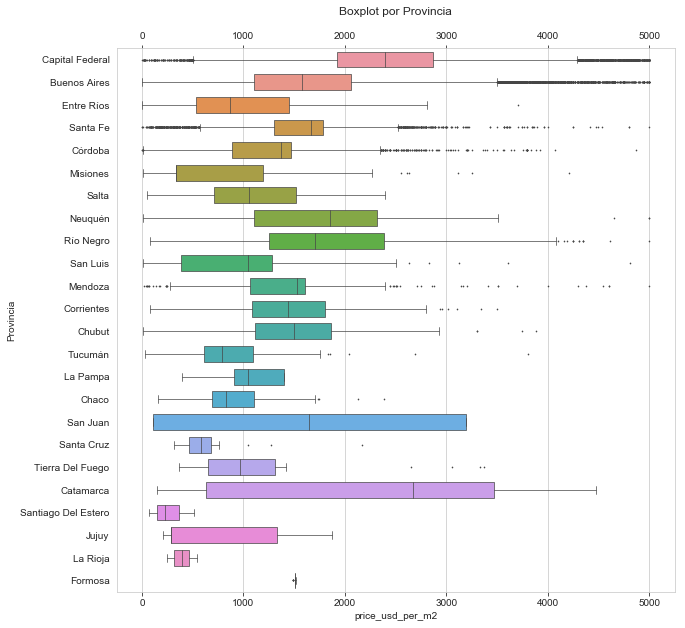

In [19]:
# boxplot POR PROVINCIA  - price_usd_per_m2 -  ANTES

sort_prov = data_clean_ORIGINAL.Provincia.unique()

fig = plt.figure(figsize=(10, 10))
sns.set_style("whitegrid")

ax = plt.title("Boxplot por Provincia", y=1.05) # le doy un pequeño offset el título sino se superpone

ax = sns.boxplot("price_usd_per_m2", "Provincia", data= data_clean_ORIGINAL, order=sort_prov,  width=0.7, whis=1.5, fliersize=0.8, linewidth=0.7)
ax.tick_params(bottom=True, top=True, labelbottom=True, labeltop=True)

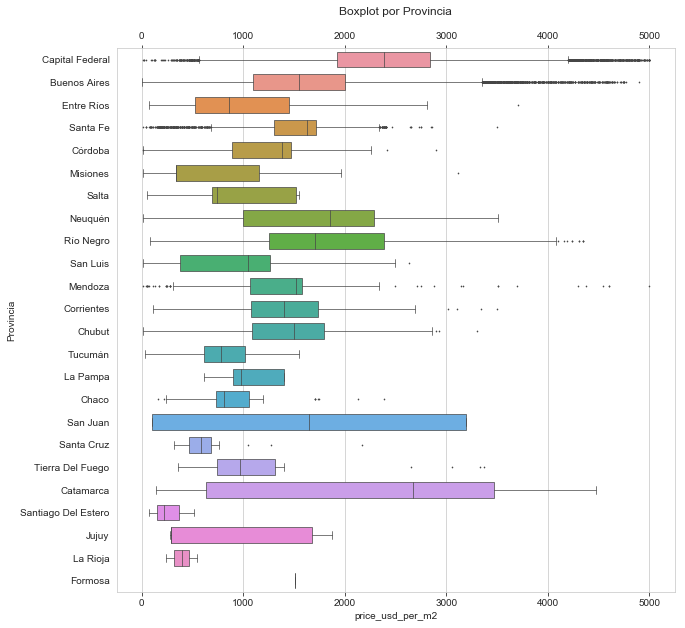

In [20]:
# boxplot POR PROVINCIA - price_usd_per_m2 - LUEGO DE ELIMINAR OUTLIERS

#sort_prov = data_clean.Provincia.unique() # ACÁ VOY A USAR EL MISMO SORT QUE ANTES, PORQUE SINO ME CAMBIA

fig = plt.figure(figsize=(10, 10))
sns.set_style("whitegrid")

ax = plt.title("Boxplot por Provincia", y=1.05) # le doy un pequeño offset el título sino se superpone

ax = sns.boxplot("price_usd_per_m2", "Provincia", data= data_clean, order=sort_prov,  width=0.7, whis=1.5, fliersize=0.8, linewidth=0.7)
ax.tick_params(bottom=True, top=True, labelbottom=True, labeltop=True)

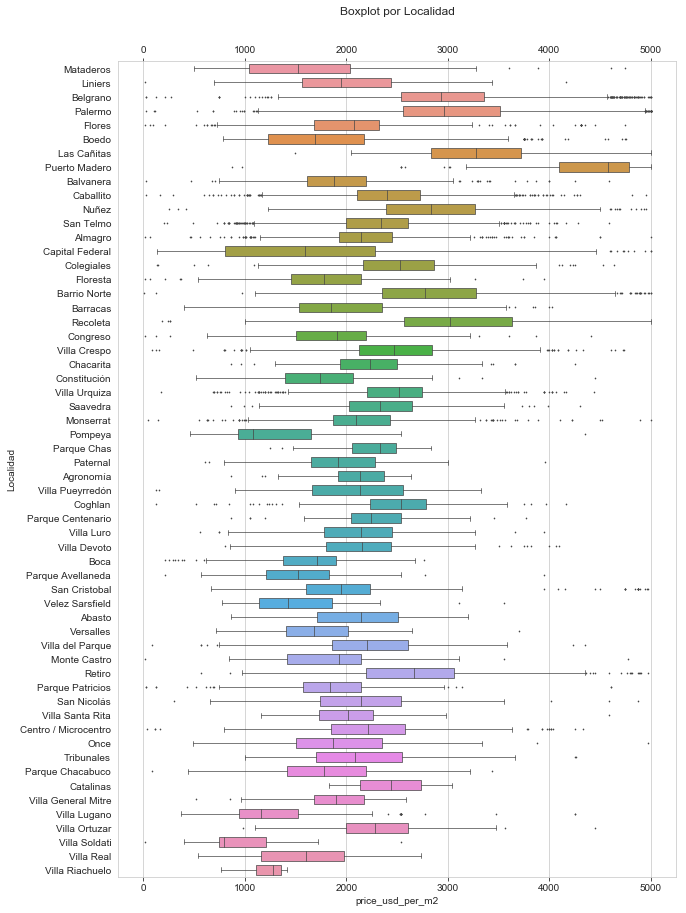

In [21]:
#from pylab import savefig  - price_usd_per_m2 -  ANTES (ejemplo sólo con CABA)

# boxplot POR LOCALIDAD - EJEMPLO: SÓLO CAPITAL FEDERAL
grupos_x_capital= data_clean_ORIGINAL.loc[(data_clean_ORIGINAL["Área"] == "Capital Federal")]

sort_local = grupos_x_capital.Localidad.unique()  

ax = plt.figure(figsize=(10, 15))
sns.set_style("whitegrid")

ax = plt.title("Boxplot por Localidad", y=1.05) # le doy un pequeño offset el título sino se superpone

ax = sns.boxplot("price_usd_per_m2", "Localidad", data= grupos_x_capital, order=sort_local,  width=0.7, whis=1.5, fliersize=0.8, linewidth=0.7)
ax.tick_params(bottom=True, top=True, labelbottom=True, labeltop=True)

ax.figure.savefig("output_antes.png", bbox_inches='tight')


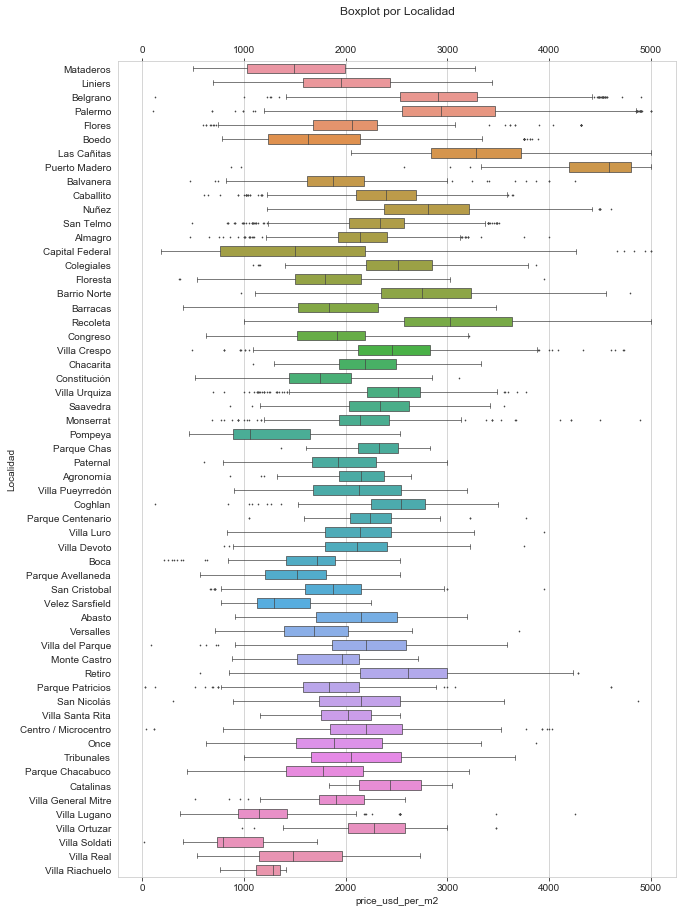

In [22]:
# boxplot POR LOCALIDAD  - price_usd_per_m2 -  LUEGO DE ELIMINAR OUTLIERS (ejemplo sólo con CABA)

grupos_x_capital= data_clean.loc[(data_clean_ORIGINAL["Área"] == "Capital Federal")]

#sort_local = grupos_x_capital.Localidad.unique() # ACÁ VOY A USAR EL MISMO SORT QUE ANTES, PORQUE SINO ME CAMBIA

fig = plt.figure(figsize=(10, 15))
sns.set_style("whitegrid")

ax = plt.title("Boxplot por Localidad", y=1.05) # le doy un pequeño offset el título sino se superpone

ax = sns.boxplot("price_usd_per_m2", "Localidad", data= grupos_x_capital, order=sort_local, width=0.7, whis=1.5, fliersize=0.8, linewidth=0.7)
ax.tick_params(bottom=True, top=True, labelbottom=True, labeltop=True)

ax.figure.savefig("output_depues.png", bbox_inches='tight')

<hr id="ToCSV">
<h2 style="color: lightblue">GENERAR CSV FINAL</h2>

In [23]:
data_clean.to_csv("CleanCSV/Clean08_OultiersxZona.csv")